# 初期設定

In [1]:
from typing import *
import os
from glob import glob
from datetime import datetime
import math
import random as rn
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from nptyping import NDArray
from minepy import MINE as Mine
from crypto_data_fetcher.gmo import GmoFetcher
from scipy.stats import ttest_1samp
import talib
import shap
import numba
from tqdm.notebook import tqdm

# 機械学習ライブラリ
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score, KFold, TimeSeriesSplit
from sklearn.metrics import accuracy_score, mean_squared_error, confusion_matrix, classification_report, f1_score, r2_score
from sklearn.linear_model import Ridge, RidgeCV, LassoCV, LogisticRegression, ElasticNet
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor, RandomForestClassifier
import joblib
import optuna

sns.set_style('whitegrid')
colors = ['#de3838', '#007bc3', '#ffd12a']
markers = ['o', 'x', ',']
%config InlineBackend.figure_formats = ['svg']

np.random.seed(123)
rn.seed(123)

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# データ読み込み

In [2]:
dtype = {
    'timestamp': str,
    'open': float,
    'high': float,
    'low': float,
    'close': float,
    'volume': float}

# BTC
df = pd.read_csv('ohlcv_15min_1226_btc.csv', dtype=dtype, parse_dates=['timestamp']).dropna()
display(df)

# df_btc_5m = pd.read_csv('ohlcv_5min_1226_btc.csv', dtype=dtype, parse_dates=['timestamp']).dropna()
# display(df_btc_5m)

# df_btc_3m = pd.read_csv('ohlcv_3min_1226_btc.csv', dtype=dtype, parse_dates=['timestamp']).dropna()
# display(df_btc_2_5m)

# # ETH
# df_eth = pd.read_csv('ohlcv_15min_1226_eth.csv', dtype=dtype, parse_dates=['timestamp']).dropna()
# display(df_eth)

# df_eth_5m = pd.read_csv('ohlcv_5min_1226_eth.csv', dtype=dtype, parse_dates=['timestamp']).dropna()
# display(df_eth_5m)


,timestamp,open,high,low,close,volume
0,2020-01-01 00:00:00+00:00,7168.5,7169.0,7156.5,7159.0,4834467.0
1,2020-01-01 00:15:00+00:00,7159.0,7160.0,7158.0,7158.0,2117619.0
2,2020-01-01 00:30:00+00:00,7158.5,7161.0,7158.0,7159.0,3374198.0
3,2020-01-01 00:45:00+00:00,7159.5,7159.5,7154.5,7154.5,2530284.0
4,2020-01-01 01:00:00+00:00,7154.5,7167.0,7154.5,7166.5,3421407.0
...,...,...,...,...,...,...
69667,2021-12-26 22:45:00+00:00,51125.0,51127.5,50964.5,51011.5,11798936.0
69668,2021-12-26 23:00:00+00:00,51011.5,51081.5,50810.0,50885.0,24076253.0
69669,2021-12-26 23:15:00+00:00,50885.0,50885.5,50647.5,50715.0,33846977.0
69670,2021-12-26 23:30:00+00:00,50714.5,50825.5,50695.5,50791.0,9718853.0


In [3]:
df['fee'] = -0.00025
display(df)
df.to_pickle('df_ohlcv_with_fee.pkl')

,timestamp,open,high,low,close,volume,fee
0,2020-01-01 00:00:00+00:00,7168.5,7169.0,7156.5,7159.0,4834467.0,-0.00025
1,2020-01-01 00:15:00+00:00,7159.0,7160.0,7158.0,7158.0,2117619.0,-0.00025
2,2020-01-01 00:30:00+00:00,7158.5,7161.0,7158.0,7159.0,3374198.0,-0.00025
3,2020-01-01 00:45:00+00:00,7159.5,7159.5,7154.5,7154.5,2530284.0,-0.00025
4,2020-01-01 01:00:00+00:00,7154.5,7167.0,7154.5,7166.5,3421407.0,-0.00025
...,...,...,...,...,...,...,...
69667,2021-12-26 22:45:00+00:00,51125.0,51127.5,50964.5,51011.5,11798936.0,-0.00025
69668,2021-12-26 23:00:00+00:00,51011.5,51081.5,50810.0,50885.0,24076253.0,-0.00025
69669,2021-12-26 23:15:00+00:00,50885.0,50885.5,50647.5,50715.0,33846977.0,-0.00025
69670,2021-12-26 23:30:00+00:00,50714.5,50825.5,50695.5,50791.0,9718853.0,-0.00025


# 特徴量生成

In [4]:
def get_every_15min_datas(df: pd.DataFrame) -> pd.DataFrame:
    """15分ごとのにデータを整形する"""

    def parse_to_minute(timestamp):
        return timestamp.minute

    df = df.copy()
    df['temp'] = np.vectorize(parse_to_minute)(df['timestamp'])
    return df[df['temp'] % 15 == 0].drop(columns=['temp'])

In [5]:
def up_hige_size(df):
    """上ヒゲの大きさ"""
    df = df.copy()
    uphige = np.zeros(len(df))
    high = df.high.values
    close = df.close.values
    open_ = df.open.values
    # close とopenの高い方を判定
    close_or_open = df.open.values - df.close.values
    close_or_open_sign = np.sign(close_or_open)
    close_or_open_sign = np.where(close_or_open_sign == 0, 1, close_or_open_sign)
    # 陽線
    for i in range(len(close_or_open_sign)):
        sig = close_or_open_sign[i]
        h = high[i]
        o = open_[i]
        c = close[i]
        if sig == 1:
            uphige[i] = (h - o) / c
        else:
            uphige[i] = (h - c) / c
    uphige = uphige/close
    return uphige

def down_hige_size(df):
    """下ヒゲの大きさ"""
    df = df.copy()
    downhige = np.zeros(len(df))
    low = df.low.values
    close = df.close.values
    open_ = df.open.values
    # close とopenの高い方を判定
    close_or_open = df.open.values - df.close.values
    close_or_open_sign = np.sign(close_or_open)
    close_or_open_sign = np.where(close_or_open_sign == 0, 1, close_or_open_sign)
    # 陽線
    for i in range(len(close_or_open_sign)):
        sig = close_or_open_sign[i]
        l = low[i]
        o = open_[i]
        c = close[i]

        if sig == 1:
            downhige[i] = (c - l) / c
        else:
            downhige[i] = (o - l) / c
    downhige = downhige/close
    return downhige


def calc_features(df):
    open = df['open']
    high = df['high']
    low = df['low']
    close = df['close']
    volume = df['volume']

    hilo = (df['high'] + df['low']) / 2
    df['BBANDS_upperband'], df['BBANDS_middleband'], df['BBANDS_lowerband'] = talib.BBANDS(close, timeperiod=5, nbdevup=2, nbdevdn=2, matype=0)
    df['BBANDS_upperband'] -= hilo
    df['BBANDS_middleband'] -= hilo
    df['BBANDS_lowerband'] -= hilo
    df['DEMA'] = talib.DEMA(close, timeperiod=30) - hilo
    df['EMA'] = talib.EMA(close, timeperiod=30) - hilo
    df['HT_TRENDLINE'] = talib.HT_TRENDLINE(close) - hilo
    df['KAMA'] = talib.KAMA(close, timeperiod=30) - hilo
    df['MA'] = talib.MA(close, timeperiod=30, matype=0) - hilo
    df['MIDPOINT'] = talib.MIDPOINT(close, timeperiod=14) - hilo
    df['SMA'] = talib.SMA(close, timeperiod=30) - hilo
    df['T3'] = talib.T3(close, timeperiod=5, vfactor=0) - hilo
    df['TEMA'] = talib.TEMA(close, timeperiod=30) - hilo
    df['TRIMA'] = talib.TRIMA(close, timeperiod=30) - hilo
    df['WMA'] = talib.WMA(close, timeperiod=30) - hilo

    df['ADX'] = talib.ADX(high, low, close, timeperiod=14)
    df['ADXR'] = talib.ADXR(high, low, close, timeperiod=14)
    df['APO'] = talib.APO(close, fastperiod=12, slowperiod=26, matype=0)
    df['AROON_aroondown'], df['AROON_aroonup'] = talib.AROON(high, low, timeperiod=14)
    df['AROONOSC'] = talib.AROONOSC(high, low, timeperiod=14)
    df['BOP'] = talib.BOP(open, high, low, close)
    df['CCI'] = talib.CCI(high, low, close, timeperiod=14)
    df['DX'] = talib.DX(high, low, close, timeperiod=14)
    df['MACD_macd'], df['MACD_macdsignal'], df['MACD_macdhist'] = talib.MACD(close, fastperiod=12, slowperiod=26, signalperiod=9)
    # skip MACDEXT MACDFIX たぶん同じなので
    df['MFI'] = talib.MFI(high, low, close, volume, timeperiod=14)
    df['MINUS_DI'] = talib.MINUS_DI(high, low, close, timeperiod=14)
    df['MINUS_DM'] = talib.MINUS_DM(high, low, timeperiod=14)
    df['MOM'] = talib.MOM(close, timeperiod=10)
    df['PLUS_DI'] = talib.PLUS_DI(high, low, close, timeperiod=14)
    df['PLUS_DM'] = talib.PLUS_DM(high, low, timeperiod=14)
    df['RSI'] = talib.RSI(close, timeperiod=14)
    df['STOCH_slowk'], df['STOCH_slowd'] = talib.STOCH(high, low, close, fastk_period=5, slowk_period=3, slowk_matype=0, slowd_period=3, slowd_matype=0)
    df['STOCHF_fastk'], df['STOCHF_fastd'] = talib.STOCHF(high, low, close, fastk_period=5, fastd_period=3, fastd_matype=0)
    df['STOCHRSI_fastk'], df['STOCHRSI_fastd'] = talib.STOCHRSI(close, timeperiod=14, fastk_period=5, fastd_period=3, fastd_matype=0)
    df['TRIX'] = talib.TRIX(close, timeperiod=30)
    df['ULTOSC'] = talib.ULTOSC(high, low, close, timeperiod1=7, timeperiod2=14, timeperiod3=28)
    df['WILLR'] = talib.WILLR(high, low, close, timeperiod=14)

    df['AD'] = talib.AD(high, low, close, volume)
    df['ADOSC'] = talib.ADOSC(high, low, close, volume, fastperiod=3, slowperiod=10)
    df['OBV'] = talib.OBV(close, volume)

    df['ATR'] = talib.ATR(high, low, close, timeperiod=14)
    df['NATR'] = talib.NATR(high, low, close, timeperiod=14)
    df['TRANGE'] = talib.TRANGE(high, low, close)

    df['HT_DCPERIOD'] = talib.HT_DCPERIOD(close)
    df['HT_DCPHASE'] = talib.HT_DCPHASE(close)
    df['HT_PHASOR_inphase'], df['HT_PHASOR_quadrature'] = talib.HT_PHASOR(close)
    df['HT_SINE_sine'], df['HT_SINE_leadsine'] = talib.HT_SINE(close)
    df['HT_TRENDMODE'] = talib.HT_TRENDMODE(close)

    df['BETA'] = talib.BETA(high, low, timeperiod=5)
    df['CORREL'] = talib.CORREL(high, low, timeperiod=30)
    df['LINEARREG'] = talib.LINEARREG(close, timeperiod=14) - close
    df['LINEARREG_ANGLE'] = talib.LINEARREG_ANGLE(close, timeperiod=14)
    df['LINEARREG_INTERCEPT'] = talib.LINEARREG_INTERCEPT(close, timeperiod=14) - close
    df['LINEARREG_SLOPE'] = talib.LINEARREG_SLOPE(close, timeperiod=14)
    df['STDDEV'] = talib.STDDEV(close, timeperiod=5, nbdev=1)

    df['uphige_size'] = up_hige_size(df)
    df['downhige_size'] = down_hige_size(df)

    df['pct'] = df['close'].pct_change()  # 変化率
    # 平均足を使った戦略: https://note.com/btcml/n/n6198a3714fe5
    df['heikin_cl'] = 0.25 * (df['open'] + df['high'] + df['low'] + df['close'])
    df['heikin_op'] = df['heikin_cl'].ewm(1, adjust=False).mean().shift(1)
    for span in [5, 15, 25]:
        df[f'pct_mean{span}']= df['pct'].rolling(span).mean()  # 変化率の偏差
        df[f'pct_std{span}']= df['pct'].rolling(span).std()  # 変化率の偏差
        df[f'heikin_cl_mean{span}'] = df['heikin_cl'].rolling(span).mean()
        df[f'heikin_cl_std{span}'] = df['heikin_cl'].rolling(span).std()
        df[f'heikin_op_mean{span}'] = df['heikin_op'].rolling(span).mean()
        df[f'heikin_op_std{span}'] = df['heikin_op'].rolling(span).std()

    return df


df = pd.read_pickle('df_ohlcv_with_fee.pkl')
df = calc_features(df)

df = df.set_index('timestamp')


display(df)

print('NaNが含まれている行数:', df.isnull().any(axis=1).sum())

df.to_pickle('df_features.pkl')

,open,high,low,close,volume,fee,BBANDS_upperband,BBANDS_middleband,BBANDS_lowerband,DEMA,EMA,HT_TRENDLINE,KAMA,MA,MIDPOINT,SMA,T3,TEMA,TRIMA,WMA,ADX,ADXR,APO,AROON_aroondown,AROON_aroonup,AROONOSC,BOP,CCI,DX,MACD_macd,MACD_macdsignal,MACD_macdhist,MFI,MINUS_DI,MINUS_DM,MOM,PLUS_DI,PLUS_DM,RSI,STOCH_slowk,STOCH_slowd,STOCHF_fastk,STOCHF_fastd,STOCHRSI_fastk,STOCHRSI_fastd,TRIX,ULTOSC,WILLR,AD,ADOSC,OBV,ATR,NATR,TRANGE,HT_DCPERIOD,HT_DCPHASE,HT_PHASOR_inphase,HT_PHASOR_quadrature,HT_SINE_sine,HT_SINE_leadsine,HT_TRENDMODE,BETA,CORREL,LINEARREG,LINEARREG_ANGLE,LINEARREG_INTERCEPT,LINEARREG_SLOPE,STDDEV,uphige_size,downhige_size,pct,heikin_cl,heikin_op,pct_mean5,pct_std5,heikin_cl_mean5,heikin_cl_std5,heikin_op_mean5,heikin_op_std5,pct_mean15,pct_std15,heikin_cl_mean15,heikin_cl_std15,heikin_op_mean15,heikin_op_std15,pct_mean25,pct_std25,heikin_cl_mean25,heikin_cl_std25,heikin_op_mean25,heikin_op_std25
timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00+00:00,7168.5,7169.0,7156.5,7159.0,4834467.0,-0.00025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.760000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-2.900680e+06,NaN,4.834467e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.755854e-09,4.877927e-08,NaN,7163.250,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-01 00:15:00+00:00,7159.0,7160.0,7158.0,7158.0,2117619.0,-0.00025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-5.018299e+06,NaN,2.716848e+06,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.951716e-08,0.000000e+00,-0.000140,7158.750,7163.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-01 00:30:00+00:00,7158.5,7161.0,7158.0,7159.0,3374198.0,-0.00025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.166667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-6.143032e+06,NaN,6.091046e+06,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.902341e-08,9.755854e-09,0.000140,7159.125,7161.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-01 00:45:00+00:00,7159.5,7159.5,7154.5,7154.5,2530284.0,-0.00025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-8.673316e+06,NaN,3.560762e+06,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,0.000000e+00,-0.000629,7157.000,7160.062500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-01 01:00:00+00:00,7154.5,7167.0,7154.5,7166.5,3421407.0,-0.00025,6.483262,-1.35,-9.183262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.960000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-5.525621e+06,NaN,6.982169e+06,NaN,NaN,12.5,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,3.916631,9.735445e-09,0.000000e+00,0.001677,7160.625,7158.531250,NaN,NaN,7159.750,2.343542,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-26 22:45:00+00:00,51125.0,51127.5,50964.5,51011.5,11798936.0,-0.00025,103.231550,-99.00,-301.231550,-331.116046,-588.966300,-586.302823,-534.996945,-642.033333,-465.25,-642.033333,-424.744557,-164.283206,-693.931250,-521.667742,30.7005

NaNが含まれている行数: 88


In [6]:
features = sorted([
    'ADX',
    'ADXR',
    'APO',
    'AROON_aroondown',
    'AROON_aroonup',
    'AROONOSC',
    'CCI',
    'DX',
    'MACD_macd',
    'MACD_macdsignal',
    'MACD_macdhist',
    'MFI',
#     'MINUS_DI',
#     'MINUS_DM',
    'MOM',
#     'PLUS_DI',
#     'PLUS_DM',
    'RSI',
    'STOCH_slowk',
    'STOCH_slowd',
    'STOCHF_fastk',
#     'STOCHRSI_fastd',
    'ULTOSC',
    'WILLR',
#     'ADOSC',
#     'NATR',
    'HT_DCPERIOD',
    'HT_DCPHASE',
    'HT_PHASOR_inphase',
    'HT_PHASOR_quadrature',
    # 'HT_TRENDMODE',
    'BETA',
    'LINEARREG',
    'LINEARREG_ANGLE',
    # 'LINEARREG_INTERCEPT',
    # 'LINEARREG_SLOPE',
    'STDDEV',
    'BBANDS_upperband',
    'BBANDS_middleband',
    'BBANDS_lowerband',
    'DEMA',
    'EMA',
    'HT_TRENDLINE',
    'KAMA',
    'MA',
    'MIDPOINT',
    'T3',
    'TEMA',
    'TRIMA',
    'WMA',

    'pct',
    'pct_mean5',
    'pct_mean15',
    'pct_mean25',
    'pct_std5',
    'pct_std15',
    'pct_std25',
    'uphige_size',
    'downhige_size',

    'heikin_cl',
    'heikin_op',
    'heikin_cl_mean5',
    'heikin_op_mean5',
    'heikin_cl_mean15',
    'heikin_op_mean15',
    'heikin_cl_mean25',
    'heikin_op_mean25',
    'heikin_cl_std5',
    'heikin_op_std5',
    'heikin_cl_std15',
    'heikin_op_std15',
    'heikin_cl_std25',
    'heikin_op_std25',
])


print(features)
print('num of features', len(features))

['ADX', 'ADXR', 'APO', 'AROONOSC', 'AROON_aroondown', 'AROON_aroonup', 'BBANDS_lowerband', 'BBANDS_middleband', 'BBANDS_upperband', 'BETA', 'CCI', 'DEMA', 'DX', 'EMA', 'HT_DCPERIOD', 'HT_DCPHASE', 'HT_PHASOR_inphase', 'HT_PHASOR_quadrature', 'HT_TRENDLINE', 'KAMA', 'LINEARREG', 'LINEARREG_ANGLE', 'MA', 'MACD_macd', 'MACD_macdhist', 'MACD_macdsignal', 'MFI', 'MIDPOINT', 'MOM', 'RSI', 'STDDEV', 'STOCHF_fastk', 'STOCH_slowd', 'STOCH_slowk', 'T3', 'TEMA', 'TRIMA', 'ULTOSC', 'WILLR', 'WMA', 'downhige_size', 'heikin_cl', 'heikin_cl_mean15', 'heikin_cl_mean25', 'heikin_cl_mean5', 'heikin_cl_std15', 'heikin_cl_std25', 'heikin_cl_std5', 'heikin_op', 'heikin_op_mean15', 'heikin_op_mean25', 'heikin_op_mean5', 'heikin_op_std15', 'heikin_op_std25', 'heikin_op_std5', 'pct', 'pct_mean15', 'pct_mean25', 'pct_mean5', 'pct_std15', 'pct_std25', 'pct_std5', 'uphige_size']
num of features 63


# 特徴量選択

In [7]:
def calc_timeseries_dependence_of_features(df, features, is_show=False) -> Tuple[float, pd.DataFrame]:
    df = df.copy()
    model = lgb.LGBMRegressor(n_jobs=-1, random_state=1)
    model.fit(df[features], np.arange(df.shape[0]))
    lgbm_adv_importance = model.feature_importances_
    feature_imp = pd.DataFrame(sorted(zip(model.feature_importances_, features)), columns=['Value','Feature'])
    cv = KFold(n_splits=2, shuffle=True, random_state=0)
    scores = cross_val_score(model, df[features], np.arange(df.shape[0]), scoring='r2', cv=cv)
    score_mean = np.mean(scores)

    if is_show:
        plt.figure(figsize=(15, 30))
        sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
        plt.title('LightGBM Features adv val (avg over folds)')
        plt.tight_layout()
        plt.show()
        print('スコア計算。スコアが高いと汎化性能が悪い可能性ある (目安は0.3以下)')
        print('scores', scores)
        print('score mean, std', np.mean(scores), np.std(scores))

    return score_mean, feature_imp


def remove_timeseries_dependence_of_features(feature_imp: pd.DataFrame, features: List[str]) -> List[str]:
    removed_features = features.copy()
    removed_features.remove(feature_imp['Feature'].iloc[-1])  # 値が一番大きい特徴量
    return removed_features

dfは特徴量が入ったDataFrame
featuresは使う特徴量カラム名配列
重要度表示。重要度が高いものは汎化性能に悪影響を与える可能性がある


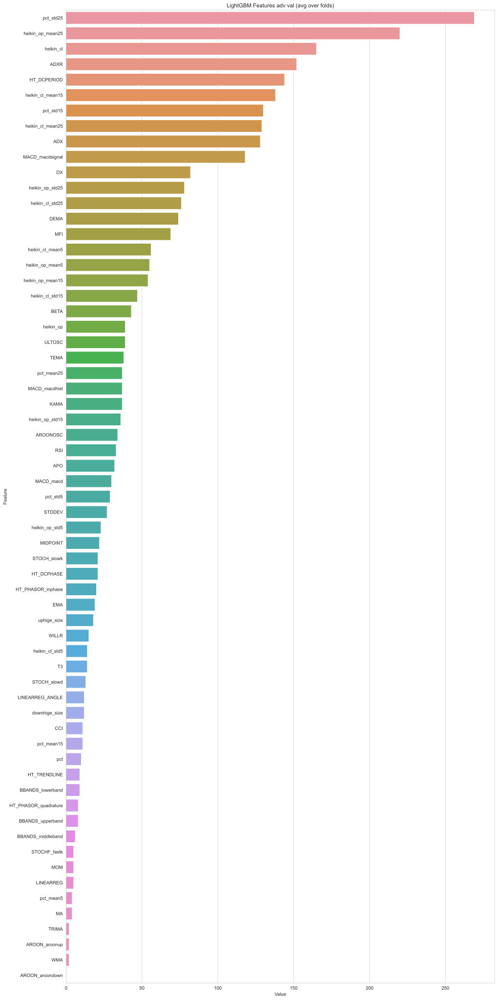

スコア計算。スコアが高いと汎化性能が悪い可能性ある (目安は0.3以下)
scores [0.93900909 0.9417858 ]
score mean, std 0.9403974415724562 0.0013883562625264245


In [8]:
df = pd.read_pickle('df_features.pkl')

print('dfは特徴量が入ったDataFrame')
print('featuresは使う特徴量カラム名配列')
print('重要度表示。重要度が高いものは汎化性能に悪影響を与える可能性がある')

_, _ = calc_timeseries_dependence_of_features(df=df, features=features, is_show=True)

In [157]:
df = pd.read_pickle('df_features.pkl')
score, feature_imp = calc_timeseries_dependence_of_features(df=df, features=features, is_show=False)

removed_features = features.copy()
while score > 0.3:
    removed_features = remove_timeseries_dependence_of_features(feature_imp=feature_imp, features=removed_features)
    score, feature_imp = calc_timeseries_dependence_of_features(df=df, features=removed_features, is_show=False)
    print(score)

0.9945283387708386
0.994419269661934
0.9944156403118782
0.9643717922535027
0.9641330227726064
0.9643262443350895
0.9639284665371042
0.9398532519724394
0.9378420762590025
0.9351835719780147
0.9341276862806773
0.9319304018396385
0.9283504585177006
0.9217413627613211
0.9168538858071582
0.9085963406856279
0.9063625507922799
0.8996839804687692
0.8962524296667517
0.888388840608914
0.8843423521071894
0.8723049213046399
0.8697016082940073
0.8686941589915667
0.8677289547024956
0.8641978744624181
0.8636412807356763
0.8625090426257502
0.861814016927947
0.8621687059568046
0.858751362711376
0.8598394012218402
0.8583326497590725
0.8567711859547673
0.8573135893026367
0.8548563519742441
0.8543878633871494
0.8538031795853391
0.8532454562331173
0.8520970458761139
0.8516915253363748
0.8509628923706445
0.8499405533530151
0.8488160035889432
0.8471708717924686
0.8475376133760006
0.846583103338655
0.8463561584677545
0.8457682959506477
0.845401327769197
0.845401327769197
0.8448373099149
0.8446052115751557
0.8

In [159]:
print(removed_features)
print(len(removed_features))

['AROONOSC', 'AROON_aroondown', 'AROON_aroonup', 'BETA', 'CCI', 'HT_DCPERIOD', 'HT_TRENDMODE', 'MFI', 'STOCHF_fastk', 'STOCH_slowd', 'STOCH_slowk', 'ULTOSC', 'WILLR', 'AROONOSC_btc5m', 'AROON_aroondown_btc5m', 'AROON_aroonup_btc5m', 'BETA_btc5m', 'CCI_btc5m', 'HT_DCPHASE_btc5m', 'HT_TRENDMODE_btc5m', 'MFI_btc5m', 'STOCHF_fastk_btc5m', 'STOCH_slowd_btc5m', 'STOCH_slowk_btc5m', 'ULTOSC_btc5m', 'WILLR_btc5m', 'ADX_eth', 'AROONOSC_eth', 'AROON_aroondown_eth', 'AROON_aroonup_eth', 'BETA_eth', 'CCI_eth', 'DX_eth', 'HT_DCPERIOD_eth', 'HT_DCPHASE_eth', 'HT_TRENDMODE_eth', 'STOCHF_fastk_eth', 'STOCH_slowd_eth', 'STOCH_slowk_eth', 'ULTOSC_eth', 'WILLR_eth', 'ADX_eth5m', 'ADXR_eth5m', 'AROONOSC_eth5m', 'AROON_aroondown_eth5m', 'AROON_aroonup_eth5m', 'BETA_eth5m', 'CCI_eth5m', 'DX_eth5m', 'HT_DCPERIOD_eth5m', 'HT_DCPHASE_eth5m', 'HT_TRENDMODE_eth5m', 'MFI_eth5m', 'STOCHF_fastk_eth5m', 'STOCH_slowd_eth5m', 'STOCH_slowk_eth5m', 'ULTOSC_eth5m', 'WILLR_eth5m']
58


dfは特徴量が入ったDataFrame
featuresは使う特徴量カラム名配列
重要度表示。重要度が高いものは汎化性能に悪影響を与える可能性がある


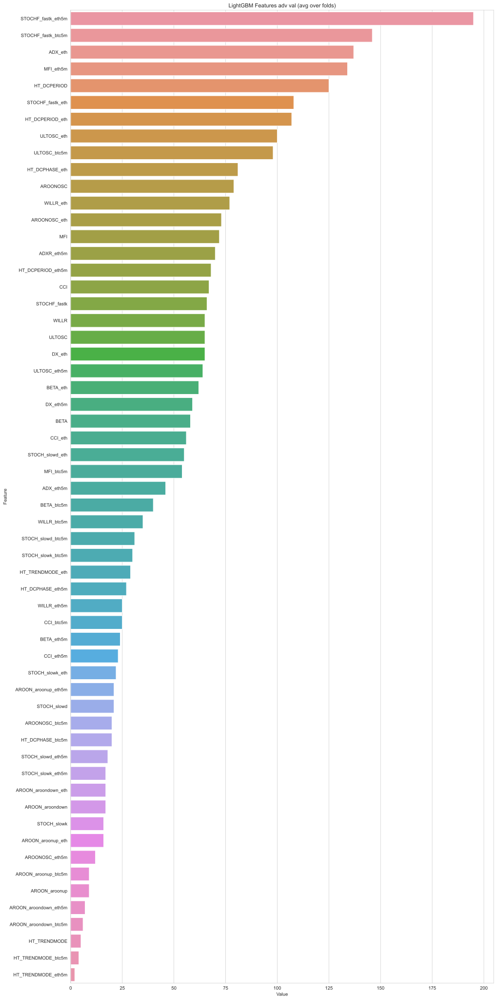

スコア計算。スコアが高いと汎化性能が悪い可能性ある (目安は0.3以下)
scores [0.19948326 0.2015201 ]
score mean, std 0.20050168281693587 0.0010184198475102213


In [160]:
df = pd.read_pickle('df_features.pkl')

print('dfは特徴量が入ったDataFrame')
print('featuresは使う特徴量カラム名配列')
print('重要度表示。重要度が高いものは汎化性能に悪影響を与える可能性がある')

_, _ = calc_timeseries_dependence_of_features(df=df, features=removed_features, is_show=True)

In [161]:
features = removed_features.copy()

# FEP計算

In [7]:
@numba.njit
def calc_force_entry_price(entry_price=None, lo=None, pips=None):
    y = entry_price.copy()
    y[:] = np.nan
    force_entry_time = entry_price.copy()
    force_entry_time[:] = np.nan
    for i in range(entry_price.size):
        for j in range(i + 1, entry_price.size):
            if round(lo[j] / pips) < round(entry_price[j - 1] / pips):
                y[i] = entry_price[j - 1]
                force_entry_time[i] = j - i
                break
    return y, force_entry_time

In [8]:
def calc_y(df,param):
    # 呼び値 (取引所、取引ペアごとに異なるので、適切に設定してください)
    pips = 0.5

    # ATRで指値距離を計算します
    limit_price_dist = df['ATR'] * param['atr']
    limit_price_dist = np.maximum(1, (limit_price_dist / pips).round().fillna(1)) * pips

    # 終値から両側にlimit_price_distだけ離れたところに、買い指値と売り指値を出します
    df['buy_price'] = df['close'] - limit_price_dist
    df['sell_price'] = df['close'] + limit_price_dist

    #df['buy_price'] = df['cl'] + df['BBANDS_lowerband'] 
    #df['sell_price'] = df['cl'] + limit_price_dist 

    # Force Entry Priceの計算
    df['buy_fep'], df['buy_fet'] = calc_force_entry_price(
        entry_price=df['buy_price'].values,
        lo=df['low'].values,
        pips=pips,
    )

    # calc_force_entry_priceは入力と出力をマイナスにすれば売りに使えます
    df['sell_fep'], df['sell_fet'] = calc_force_entry_price(
        entry_price=-df['sell_price'].values,
        lo=-df['high'].values, # 売りのときは高値
        pips=pips,
    )
    df['sell_fep'] *= -1

    horizon = 1 # エントリーしてからエグジットを始めるまでの待ち時間 (1以上である必要がある)
    fee = df['fee'] # maker手数料

    # 指値が約定したかどうか (0, 1)
    df['buy_executed'] = ((df['buy_price'] / pips).round() > (df['low'].shift(-1) / pips).round()).astype('float64')
    df['sell_executed'] = ((df['sell_price'] / pips).round() < (df['high'].shift(-1) / pips).round()).astype('float64')

    # yを計算
    df['y_buy'] = np.where(
        df['buy_executed'],
        df['sell_fep'].shift(-horizon) / df['buy_price'] - 1 - 2 * fee,
        0
    )
    df['y_sell'] = np.where(
        df['sell_executed'],
        -(df['buy_fep'].shift(-horizon) / df['sell_price'] - 1) - 2 * fee,
        0
    )

    # バックテストで利用する取引コストを計算
    df['buy_cost'] = np.where(
        df['buy_executed'],
        df['buy_price'] / df['close'] - 1 + fee,
        0
    )
    df['sell_cost'] = np.where(
        df['sell_executed'],
        -(df['sell_price'] / df['close'] - 1) + fee,
        0
    )
    return df

df_features = pd.read_pickle('df_features.pkl')
df_features = df_features[-5000:]
def objective(trial):
    atr = trial.suggest_uniform('atr', 0.0, 1.0)
    param = {"atr":atr}
    df = calc_y(df_features,param)
    # score = df['y_buy'].cumsum().iloc[-1] + df['y_sell'].cumsum().iloc[-1]
    # score = df['y_buy'].cumsum().iloc[-1]
    score = df['y_sell'].cumsum().iloc[-1]
    return score

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=1000)
# プログラムが試行錯誤した結果最も良いパラメータを表示
print("best param: {}".format(study.best_params))
# 最も良いパラメータで実行したときの結果（返り値）を表示
print("best score: {}".format(study.best_value))

[I 2022-01-02 02:58:16,410] A new study created in memory with name: no-name-4f356bb2-3d1c-45e4-a159-a38fd7318c78
[I 2022-01-02 02:58:17,626] Trial 0 finished with value: -0.1917149591295843 and parameters: {'atr': 0.4773559469009573}. Best is trial 0 with value: -0.1917149591295843.
[I 2022-01-02 02:58:17,638] Trial 1 finished with value: -1.1348038098405768 and parameters: {'atr': 0.013670991848008796}. Best is trial 0 with value: -0.1917149591295843.
[I 2022-01-02 02:58:17,653] Trial 2 finished with value: -0.2603803127623644 and parameters: {'atr': 0.5244430740899291}. Best is trial 0 with value: -0.1917149591295843.
[I 2022-01-02 02:58:17,667] Trial 3 finished with value: -0.48902483776258016 and parameters: {'atr': 0.34023926275404603}. Best is trial 0 with value: -0.1917149591295843.
[I 2022-01-02 02:58:17,680] Trial 4 finished with value: -0.21136048852810707 and parameters: {'atr': 0.2291920127396131}. Best is trial 0 with value: -0.1917149591295843.
[I 2022-01-02 02:58:17,696

best param: {'atr': 0.8235001865833764}
best score: 0.1925252304529707


約定確率を可視化。時期によって約定確率が大きく変わると良くない。


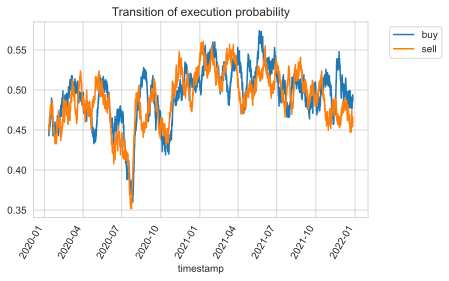

エグジットまでの時間分布を可視化。長すぎるとロングしているだけとかショートしているだけになるので良くない。


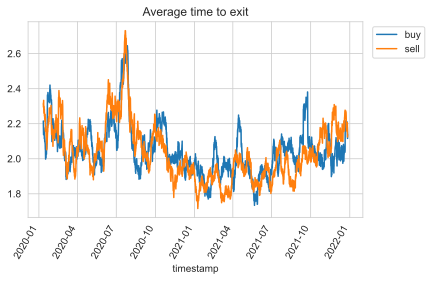

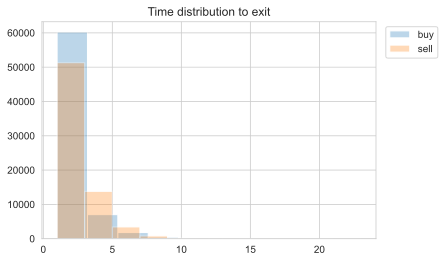

毎時刻、この執行方法でトレードした場合の累積リターン


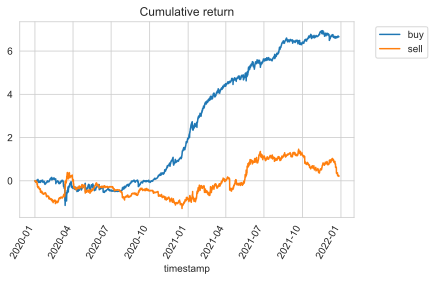

In [26]:
df = pd.read_pickle('df_features.pkl')

# 呼び値 (取引所、取引ペアごとに異なるので、適切に設定してください)
pips = 0.5

# ATRで指値距離を計算します
# limit_price_dist = df['ATR'] * 0.5
limit_price_dist = df['ATR'] * 0.36
limit_price_dist = np.maximum(1, (limit_price_dist / pips).round().fillna(1)) * pips

# 終値から両側にlimit_price_distだけ離れたところに、買い指値と売り指値を出します
df['buy_price'] = df['close'] - limit_price_dist
df['sell_price'] = df['close'] + limit_price_dist

# Force Entry Priceの計算
df['buy_fep'], df['buy_fet'] = calc_force_entry_price(
    entry_price=df['buy_price'].values,
    lo=df['low'].values,
    pips=pips,
)

# calc_force_entry_priceは入力と出力をマイナスにすれば売りに使えます
df['sell_fep'], df['sell_fet'] = calc_force_entry_price(
    entry_price=-df['sell_price'].values,
    lo=-df['high'].values, # 売りのときは高値
    pips=pips,
)
df['sell_fep'] *= -1

horizon = 1 # エントリーしてからエグジットを始めるまでの待ち時間 (1以上である必要がある)
fee = df['fee'] # maker手数料

# 指値が約定したかどうか (0, 1)
df['buy_executed'] = ((df['buy_price'] / pips).round() > (df['low'].shift(-1) / pips).round()).astype('float64')
df['sell_executed'] = ((df['sell_price'] / pips).round() < (df['high'].shift(-1) / pips).round()).astype('float64')

# yを計算
df['y_buy'] = np.where(
    df['buy_executed'],
    df['sell_fep'].shift(-horizon) / df['buy_price'] - 1 - 2 * fee,
    0
)
df['y_sell'] = np.where(
    df['sell_executed'],
    -(df['buy_fep'].shift(-horizon) / df['sell_price'] - 1) - 2 * fee,
    0
)

# バックテストで利用する取引コストを計算
df['buy_cost'] = np.where(
    df['buy_executed'],
    df['buy_price'] / df['close'] - 1 + fee,
    0
)
df['sell_cost'] = np.where(
    df['sell_executed'],
    -(df['sell_price'] / df['close'] - 1) + fee,
    0
)

print('約定確率を可視化。時期によって約定確率が大きく変わると良くない。')
df['buy_executed'].rolling(1000).mean().plot(label='buy', rot=60)
df['sell_executed'].rolling(1000).mean().plot(label='sell', rot=60)
plt.title('Transition of execution probability')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()

print('エグジットまでの時間分布を可視化。長すぎるとロングしているだけとかショートしているだけになるので良くない。')
df['buy_fet'].rolling(1000).mean().plot(label='buy', rot=60)
df['sell_fet'].rolling(1000).mean().plot(label='sell', rot=60)
plt.title('Average time to exit')
plt.legend(bbox_to_anchor=(1.2, 1))
plt.show()

df['buy_fet'].hist(alpha=0.3, label='buy')
df['sell_fet'].hist(alpha=0.3, label='sell')
plt.title('Time distribution to exit')
plt.legend(bbox_to_anchor=(1.2, 1))
plt.show()

print('毎時刻、この執行方法でトレードした場合の累積リターン')
df['y_buy'].cumsum().plot(label='buy', rot=60)
df['y_sell'].cumsum().plot(label='sell', rot=60)
plt.title('Cumulative return')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()

df.to_pickle('df_y.pkl')

# ML

### 関数定義

In [27]:
def show_lgb_feature_importances(lgb_model):
    ranking = np.argsort(-lgb_model.feature_importances_)  # 重要度のindexを降順で取得
    f, ax = plt.subplots(figsize=(15, 35))
    var_ = []
    for index in ranking:
        var_.append(features[index])
    # x は特徴量の重要度
    # yは特徴量の名前
    sns.barplot(x=lgb_model.feature_importances_[ranking], y =var_, orient='h')
    ax.set_xlabel("lightGBM feature importance")
    plt.tight_layout()
    plt.show()
    return var_


# p平均法 https://note.com/btcml/n/n0d9575882640
def calc_p_mean(x, n):
    ps = []
    for i in range(n):
        x2 = x[i * x.size // n:(i + 1) * x.size // n]
        if np.std(x2) == 0:
            ps.append(1)
        else:
            t, p = ttest_1samp(x2, 0)
            if t > 0:
                ps.append(p)
            else:
                ps.append(1)
    return np.mean(ps)


def calc_p_mean_type1_error_rate(p_mean, n):
    return (p_mean * n) ** n / math.factorial(n)


def my_cross_val_predict(estimator, X, y=None, cv=None):
    y_pred = y.copy()
    y_pred[:] = np.nan
    for train_idx, val_idx in cv:
        estimator.fit(X[train_idx], y[train_idx])
        y_pred[val_idx] = estimator.predict(X[val_idx])
    return y_pred


def show_cum_ret(df):
    # df[(df['y_pred_buy'] > 0) & (df['y_pred_sell'] < 0)]['y_buy'].cumsum().plot(label='buy', rot=60)
    df[df['random'] > 0]['y_buy'].cumsum().plot(rot=60, title='buy', color=colors[1])
    plt.show()
    # df[(df['y_pred_buy'] < 0) & (df['y_pred_sell'] > 0)]['y_sell'].cumsum().plot(label='sell', rot=60)
    df[df['y_pred_sell'] > 0]['y_sell'].cumsum().plot(rot=60, title='sell', color=colors[0])
    plt.show()
    # (df['y_buy'] * ((df['y_pred_buy'] > 0) & (df['y_pred_sell'] < 0)) + df['y_sell'] * ((df['y_pred_buy'] < 0) & (df['y_pred_sell'] > 0))).cumsum().plot(label='buy + sell', rot=60)
    (df['y_buy'] * (df['y_pred_buy'] > 0) + df['y_sell'] * (df['y_pred_sell'] > 0)).cumsum().plot(rot=60, title='buy + sell', color=colors[2])
    plt.show()

    # df['cum_ret'] = (df['y_buy'] * ((df['y_pred_buy'] > 0) & (df['y_pred_sell'] < 0)) + df['y_sell'] * ((df['y_pred_buy'] < 0) & (df['y_pred_sell'] > 0))).cumsum()
    df['cum_ret'] = (df['y_buy'] * (df['y_pred_buy'] > 0) + df['y_sell'] * (df['y_pred_sell'] > 0)).cumsum()
    x = df['cum_ret'].diff(1).dropna()
    p_mean_n = len(df) // (2 * 7 * 24 * 4)  # 2週間分 
    p_mean = calc_p_mean(x, p_mean_n)
    print('p平均法 n = {}'.format(p_mean_n))
    print('p平均 {}'.format(p_mean))
    print('エラー率 {}'.format(calc_p_mean_type1_error_rate(p_mean, p_mean_n)))

### 学習

69672
69581


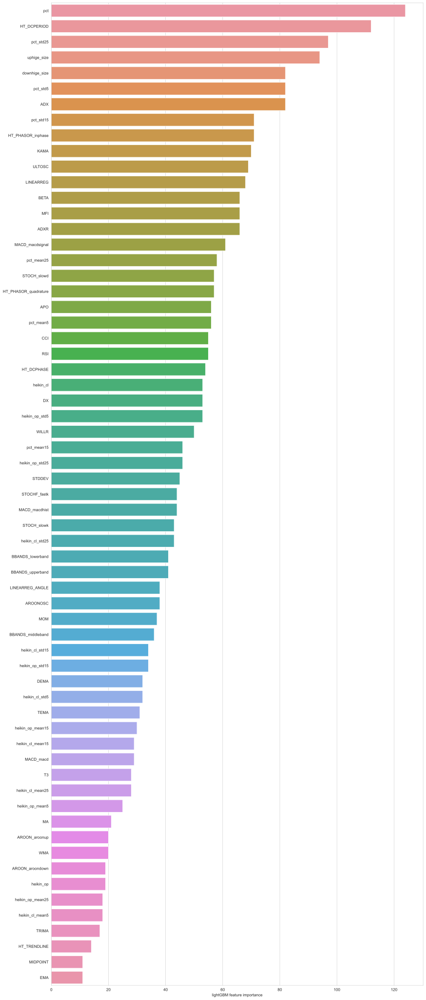

In [28]:
df = pd.read_pickle('df_y.pkl')
print(len(df))
df = df.dropna()
print(len(df))

# モデル (コメントアウトで他モデルも試してみてください)
# model = RidgeCV(alphas=np.logspace(-7, 7, num=20))
model = lgb.LGBMRegressor(boosting_type='gbdt', n_jobs=-1, random_state=1)
# model = lgb.LGBMRegressor(boosting_type='dart', n_jobs=-1, random_state=1)
# model = lgb.LGBMRegressor(boosting_type='goss', n_jobs=-1, random_state=1)

# 通常のCV
cv_indicies = list(KFold().split(df))

df['y_pred_buy'] = my_cross_val_predict(model, df[features].values, df['y_buy'].values, cv=cv_indicies)
df['y_pred_sell'] = my_cross_val_predict(model, df[features].values, df['y_sell'].values, cv=cv_indicies)

# 予測値が無い(nan)行をドロップ
df = df.dropna()

df.to_pickle('df_fit.pkl')

sorted_features = show_lgb_feature_importances(lgb_model=model)

In [29]:
print(len(df[(df['y_buy']>0) & (df['y_pred_buy']>0)]) / len(df[df['y_buy'] > 0]))
print(len(df[(df['y_sell']>0) & (df['y_pred_sell']>0)]) / len(df[df['y_sell'] > 0]))

0.5280282429273413
0.3737219819111286


In [17]:
np.random.choice([0,1],len(df))

array([0, 1, 0, ..., 1, 0, 0])

In [18]:
df['ramdom'] = np.random.choice([0,1],len(df))

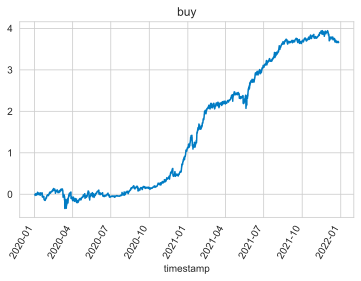

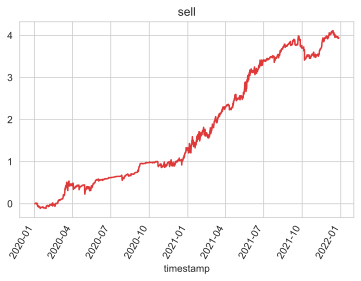

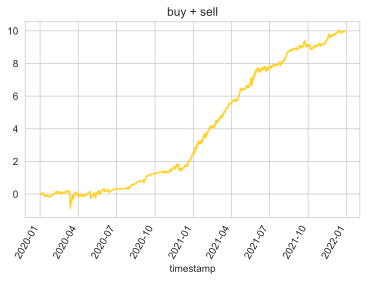

p平均法 n = 51
p平均 0.3359587654467228
エラー率 0.0005445261528913058


In [30]:
df = pd.read_pickle('df_fit.pkl')
df['random'] = np.random.choice([0,1],len(df))
show_cum_ret(df=df)

# Back Test

In [34]:
@numba.njit
def backtest(
    cl=None, hi=None, lo=None, pips=None,
    buy_entry=None, sell_entry=None,
    buy_cost=None, sell_cost=None):
    n = cl.size
    y = cl.copy() * 0.0
    poss = cl.copy() * 0.0
    ret = 0.0
    pos = 0.0
    for i in range(n):
        prev_pos = pos
        
        # exit
        if buy_cost[i]:
            vol = np.maximum(0, -prev_pos)
            ret -= buy_cost[i] * vol
            pos += vol

        if sell_cost[i]:
            vol = np.maximum(0, prev_pos)
            ret -= sell_cost[i] * vol
            pos -= vol

        # entry
        if buy_entry[i] and buy_cost[i]:
            vol = np.minimum(1.0, 1 - prev_pos) * buy_entry[i]  # 既にエントリ済みならエントリしない
            ret -= buy_cost[i] * vol
            pos += vol

        if sell_entry[i] and sell_cost[i]:
            vol = np.minimum(1.0, prev_pos + 1) * sell_entry[i]  # 既にエントリ済みならエントリしない
            ret -= sell_cost[i] * vol
            pos -= vol
        
        if i + 1 < n:
            # 実際の指値は終値からいくらかずらした値(ATRを使って終値からずらした指値)だった。
            # つまり、実際は終値よりもちょっとだけ良い値段でエントリしたり決済したはず、その分を先にcostとして計算しておき、後にまとめて調整する仕組み。
            # costと呼んでいるが、実際には終値からの調整幅を記録した値、と考えるとすっきりしそう。
            # ポジションがある限り終値の差分を計算していくので、含み益、あるいは含み損を持ち越している。
            # また、決済の指値は機械学習の判定は関係なく常に出している。
            ret += pos * (cl[i + 1] / cl[i] - 1)
            
        y[i] = ret
        poss[i] = pos
        
    return y, poss

def show_test_result(df):
    df = df.copy()

    df['cum_ret'].plot(rot=60)
    plt.title('Cumulative return')
    plt.show()

    print('ポジション推移です。変動が細かすぎて青色一色になっていると思います。')
    print('ちゃんと全ての期間でトレードが発生しているので、正常です。')
    df['poss'].plot(rot=60)
    plt.title('Position Changes')
    plt.show()

    print('ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。')
    df['poss'].rolling(1000).mean().plot(rot=60)
    plt.title('Changes in position averages')
    plt.show()

    print('取引量(ポジション差分の絶対値)の累積です。')
    print('期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。')
    df['poss'].diff(1).abs().dropna().cumsum().plot(rot=60)
    plt.title('Cumulative trading volume')
    plt.show()

    print('t検定')
    x = df['cum_ret'].diff(1).dropna()
    t, p = ttest_1samp(x, 0)
    print('t値 {}'.format(t))
    print('p値 {}'.format(p))

    x = df['cum_ret'].diff(1).dropna()
    p_mean_n = len(df) // (2 * 7 * 24 * 4)  # 2週間分 
    p_mean = calc_p_mean(x, p_mean_n)
    print('p平均法 n = {}'.format(p_mean_n))
    print('p平均 {}'.format(p_mean))
    print('エラー率 {}'.format(calc_p_mean_type1_error_rate(p_mean, p_mean_n)))

    print('result: ', df['cum_ret'][-1])

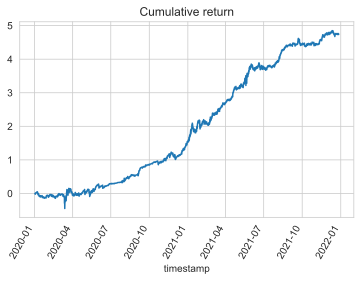

ポジション推移です。変動が細かすぎて青色一色になっていると思います。
ちゃんと全ての期間でトレードが発生しているので、正常です。


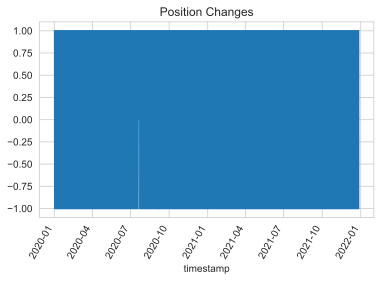

ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。


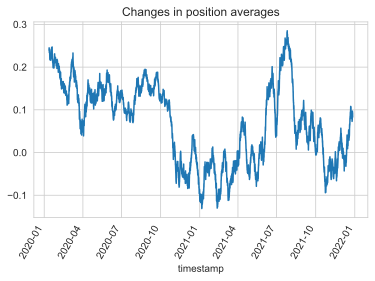

取引量(ポジション差分の絶対値)の累積です。
期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。


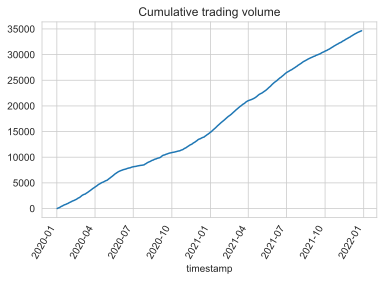

t検定
t値 4.991413523104056
p値 6.008340588300957e-07
p平均法 n = 51
p平均 0.48535653510837545
エラー率 76654.71848212447
result:  4.740767516570259


In [35]:
df = pd.read_pickle('df_fit.pkl')

# バックテストで累積リターンと、ポジションを計算
df['cum_ret'], df['poss'] = backtest(
    cl=df['close'].values,
    buy_entry=df['y_pred_buy'].values > 0,
    sell_entry=df['y_pred_sell'].values > 0,
    buy_cost=df['buy_cost'].values,
    sell_cost=df['sell_cost'].values,
)
show_test_result(df=df)

# Test(チューニングなし)

### 回帰

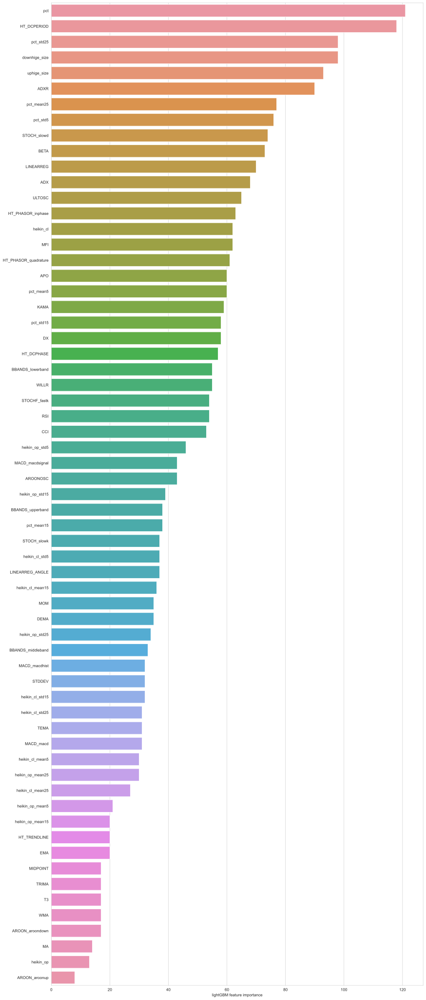

In [36]:
df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
# train_ratio = 0.95
df_train = df.loc[:len(df)*train_ratio]
df_test = df.loc[len(df)*train_ratio + 5:]


# モデル (コメントアウトで他モデルも試してみてください)
# model = RidgeCV(alphas=np.logspace(-7, 7, num=20))
model = lgb.LGBMRegressor(boosting_type='gbdt', n_jobs=-1, random_state=1)
# model = lgb.LGBMRegressor(boosting_type='dart', n_jobs=-1, random_state=1)
# model = lgb.LGBMRegressor(boosting_type='goss', n_jobs=-1, random_state=1)

def model_predict(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, y_train)
    y_pred = estimator.predict(X_test)
    return y_pred

df = df_test.copy()

df['y_pred_buy'] = model_predict(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
df['y_pred_sell'] = model_predict(model, df_train[features].values, df_train['y_sell'].values, df_test[features])

# 予測値が無い(nan)行をドロップ
df = df.dropna().set_index('timestamp')
df.to_pickle('df_fit_test.pkl')
sorted_features = show_lgb_feature_importances(lgb_model=model)

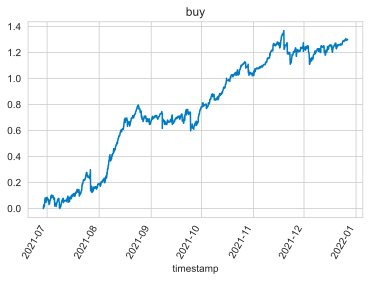

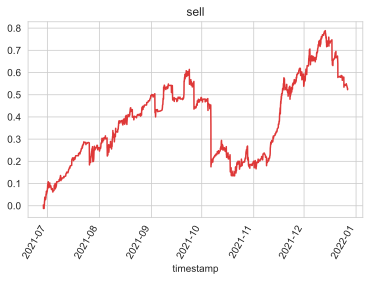

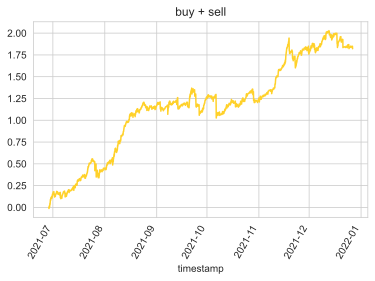

p平均法 n = 12
p平均 0.33646239106206766
エラー率 0.039181071743873974


In [37]:
df = pd.read_pickle('df_fit_test.pkl')

show_cum_ret(df=df)

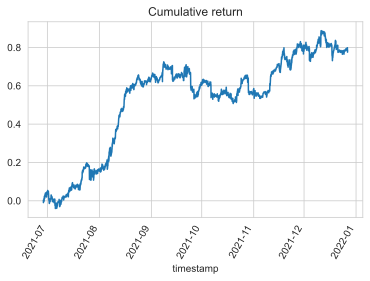

ポジション推移です。変動が細かすぎて青色一色になっていると思います。
ちゃんと全ての期間でトレードが発生しているので、正常です。


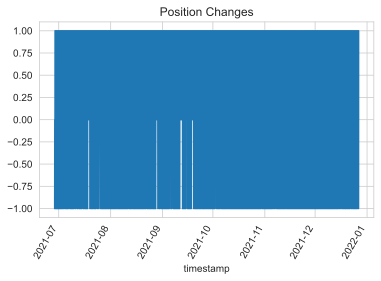

ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。


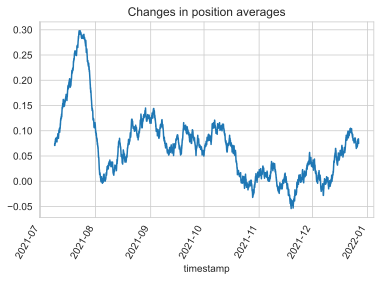

取引量(ポジション差分の絶対値)の累積です。
期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。


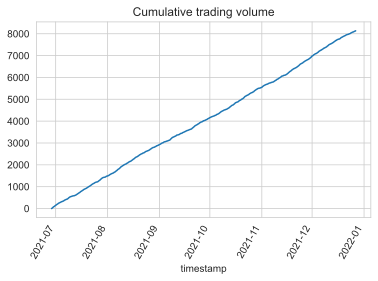

t検定
t値 2.2108318065213584
p値 0.02706045214449709
p平均法 n = 12
p平均 0.5272248787521773
エラー率 8.585957527710681
result:  0.7854606127797296


In [38]:
df = pd.read_pickle('df_fit_test.pkl')

# バックテストで累積リターンと、ポジションを計算
df['cum_ret'], df['poss'] = backtest(
    cl=df['close'].values,
    buy_entry=df['y_pred_buy'].values > 0,
    sell_entry=df['y_pred_sell'].values > 0,
    buy_cost=df['buy_cost'].values,
    sell_cost=df['sell_cost'].values,
)
show_test_result(df=df)

### 分類

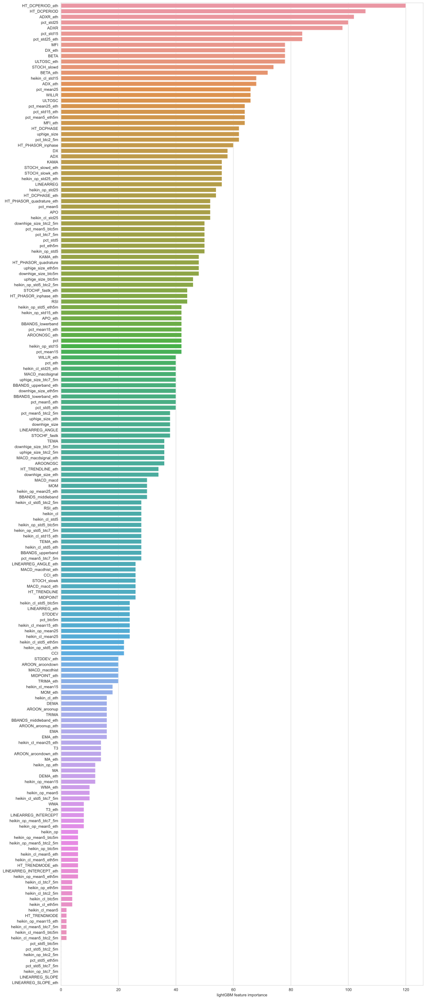

In [265]:
df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
# train_ratio = 0.95
df_train = df.loc[:len(df)*train_ratio]
df_test = df.loc[len(df)*train_ratio + 5:]


# モデル (コメントアウトで他モデルも試してみてください)
# model = RidgeCV(alphas=np.logspace(-7, 7, num=20))
# model = lgb.LGBMRegressor(boosting_type='gbdt', n_jobs=-1, random_state=1)
# model = lgb.LGBMRegressor(boosting_type='dart', n_jobs=-1, random_state=1)
# model = lgb.LGBMRegressor(boosting_type='goss', n_jobs=-1, random_state=1)
model = lgb.LGBMClassifier(boosting_type='gbdt', n_jobs=-1, random_state=1)

def model_predict_class(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, np.sign(y_train), sample_weight=np.abs(y_train))
    y_pred = estimator.predict(X_test)
    return y_pred

df = df_test.copy()

df['y_pred_buy'] = model_predict_class(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
df['y_pred_sell'] = model_predict_class(model, df_train[features].values, df_train['y_sell'].values, df_test[features])

# 予測値が無い(nan)行をドロップ
df = df.dropna().set_index('timestamp')
df.to_pickle('df_fit_test_class.pkl')
sorted_features = show_lgb_feature_importances(lgb_model=model)

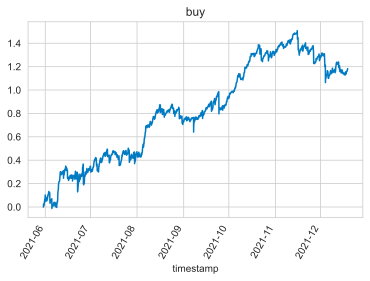

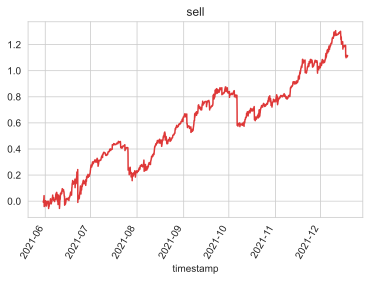

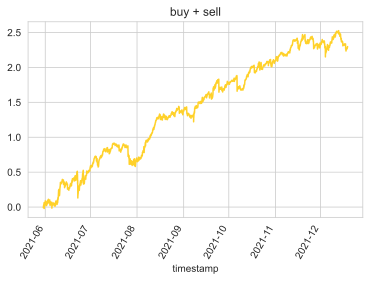

p平均法 n = 5
p平均 0.16216104761819602
エラー率 0.0029201252700616523


In [266]:
df = pd.read_pickle('df_fit_test_class.pkl')

show_cum_ret(df=df)

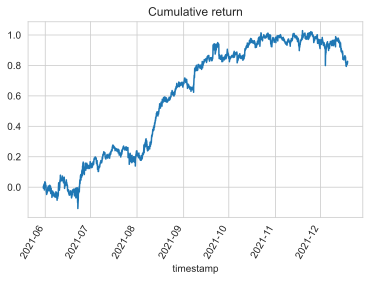

ポジション推移です。変動が細かすぎて青色一色になっていると思います。
ちゃんと全ての期間でトレードが発生しているので、正常です。


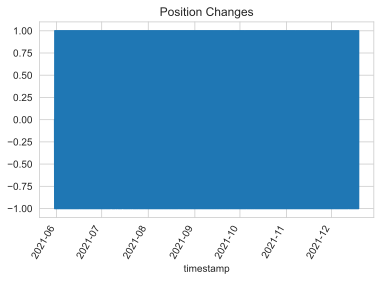

ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。


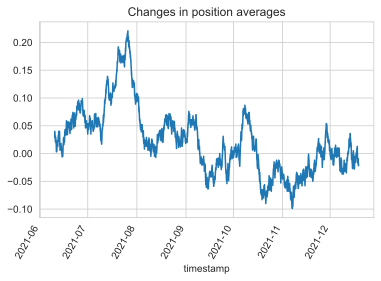

取引量(ポジション差分の絶対値)の累積です。
期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。


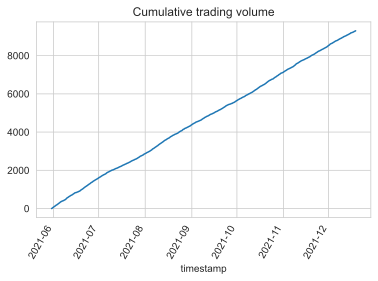

t検定
t値 1.7823419211935443
p値 0.07470913146348386
p平均法 n = 5
p平均 0.45169264006867244
エラー率 0.48964784392405797
result:  0.8272493482591675


In [267]:
df = pd.read_pickle('df_fit_test_class.pkl')

# バックテストで累積リターンと、ポジションを計算
df['cum_ret'], df['poss'] = backtest(
    cl=df['close'].values,
    buy_entry=df['y_pred_buy'].values > 0,
    sell_entry=df['y_pred_sell'].values > 0,
    buy_cost=df['buy_cost'].values,
    sell_cost=df['sell_cost'].values,
)
show_test_result(df=df)

# ハイパーパラメータチューニング

In [289]:
SAVE_BEST_PARAM_DIR = 'best_params_dir'
os.makedirs(SAVE_BEST_PARAM_DIR, exist_ok=True)


def calc_objective_p(df):
    df = df.copy()
    df['cum_ret'], _ = backtest(
        cl=df['close'].values,
        buy_entry=df['y_pred_buy'].values > 0,
        sell_entry=df['y_pred_sell'].values > 0,
        buy_cost=df['buy_cost'].values,
        sell_cost=df['sell_cost'].values)
    x = df['cum_ret'].diff(1).dropna()
    p_mean_n = 5
    p_mean = calc_p_mean(x, p_mean_n)
    p_error = calc_p_mean_type1_error_rate(p_mean, p_mean_n)
    return p_error


def show_shap(df, model):
    explainer = shap.Explainer(model)  # 学習済みモデルを与える
    shap_values = explainer.shap_values(df[features])  # 学習データでSHAP値を計算

    # 目的変数と各特徴量の相関関係を表示
    shap.summary_plot(shap_values, df[features])
    # 目的変数に対する特徴量の寄与度を表示
    shap.summary_plot(shap_values, df[features], plot_type="bar")

## 回帰

#### gbdt

In [256]:
df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:int(len(df)*train_ratio)]
df_test = df.loc[int(len(df)*train_ratio) + 5:]

cv_indicies = list(KFold().split(df_train))
# ウォークフォワード法
# cv_indicies = list(TimeSeriesSplit().split(df))

def objectives(trial):
    #==== 最適化したいパラメータ ====
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0)
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0)
    learning_rate = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    subsample = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    min_child_samples = trial.suggest_int('min_child_samples', 5, 50)
    max_depth = trial.suggest_int('max_depth', 5, 15)
    params = {
        "reg_alpha": reg_alpha,
        "reg_lambda": reg_lambda,
        "learning_rate": learning_rate,
        "colsample_bytree": colsample_bytree,
        "subsample" : subsample,
        "min_child_samples": min_child_samples,
        "max_depth": max_depth}

    model = lgb.LGBMRegressor(boosting_type='gbdt', random_state=1, **params)

    def calc_objective_pred(df_train):
        df_train = df_train.copy()
        df_train['y_pred_buy'] = my_cross_val_predict(model, df_train[features].values, df_train['y_buy'].values, cv=cv_indicies)
        df_train['y_pred_sell'] = my_cross_val_predict(model, df_train[features].values, df_train['y_sell'].values, cv=cv_indicies)
        return df_train

    df = calc_objective_pred(df_train=df_train)
    p_error = calc_objective_p(df=df)
    return p_error


sampler = optuna.samplers.TPESampler(seed=1)
study = optuna.create_study(sampler=sampler)
study.optimize(objectives, n_trials=200)

best_params = study.best_params
best_score = study.best_value

np.save(os.path.join(SAVE_BEST_PARAM_DIR, 'gbdt.npy'), best_params)

print('best score: {0}\nbest params: {1}'.format(best_score, best_params))

[I 2021-12-22 17:07:58,786] A new study created in memory with name: no-name-2b7a6d6d-d53b-463a-a99a-0b5a466e47d8
[I 2021-12-22 17:08:24,880] Trial 0 finished with value: 0.33609310517068447 and parameters: {'reg_alpha': 5.6649755830282306e-05, 'reg_lambda': 0.030403280126677572, 'learning_rate': 0.1001029373356104, 'min_child_samples': 18, 'max_depth': 6}. Best is trial 0 with value: 0.33609310517068447.
[I 2021-12-22 17:08:48,928] Trial 1 finished with value: 0.1252928969625585 and parameters: {'reg_alpha': 6.777153976882678e-08, 'reg_lambda': 4.746154837062843e-07, 'learning_rate': 0.411004654338743, 'min_child_samples': 23, 'max_depth': 10}. Best is trial 1 with value: 0.1252928969625585.
[I 2021-12-22 17:09:08,802] Trial 2 finished with value: 0.18673310282551697 and parameters: {'reg_alpha': 5.925849666609232e-05, 'reg_lambda': 0.01468843425028415, 'learning_rate': 0.2840070247583657, 'min_child_samples': 45, 'max_depth': 5}. Best is trial 1 with value: 0.1252928969625585.
[I 202

best score: 0.004880865495236215
best params: {'reg_alpha': 0.34184451384327824, 'reg_lambda': 9.153011947674836e-05, 'learning_rate': 0.11823201566401866, 'min_child_samples': 21, 'max_depth': 15}


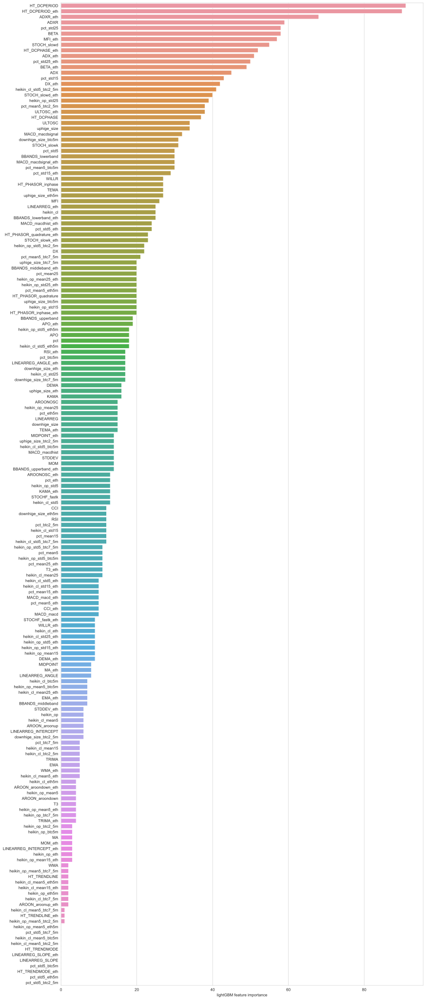

In [257]:
gbdt_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'gbdt.npy'), allow_pickle='TRUE').item()

df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:len(df)*train_ratio]
df_test = df.loc[len(df)*train_ratio + 5:]


# モデル (コメントアウトで他モデルも試してみてください)
# model = RidgeCV(alphas=np.logspace(-7, 7, num=20))
model = lgb.LGBMRegressor(boosting_type='gbdt', random_state=1, **gbdt_params)
# model = lgb.LGBMRegressor(boosting_type='dart', n_jobs=-1, random_state=1)
# model = lgb.LGBMRegressor(boosting_type='goss', n_jobs=-1, random_state=1)

def model_predict(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, y_train)
    y_pred = estimator.predict(X_test)
    return y_pred

df = df_test.copy()

df['y_pred_buy'] = model_predict(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
df['y_pred_sell'] = model_predict(model, df_train[features].values, df_train['y_sell'].values, df_test[features])

# 予測値が無い(nan)行をドロップ
df = df.dropna().set_index('timestamp')
df.to_pickle('df_fit_test_gbdt.pkl')
_ = show_lgb_feature_importances(lgb_model=model)

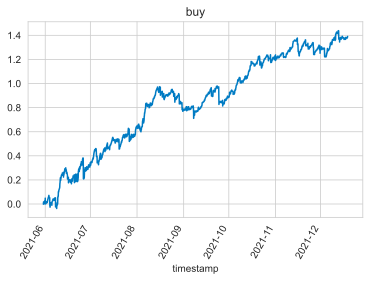

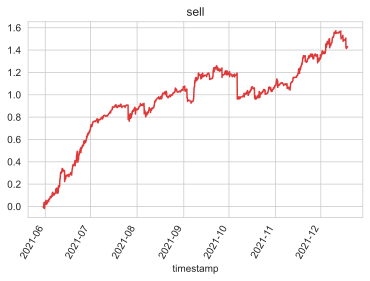

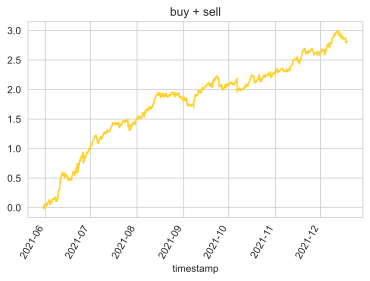

p平均法 n = 5
p平均 0.12615117771394718
エラー率 0.0008320038238378163


In [258]:
df = pd.read_pickle('df_fit_test_gbdt.pkl')

show_cum_ret(df=df)

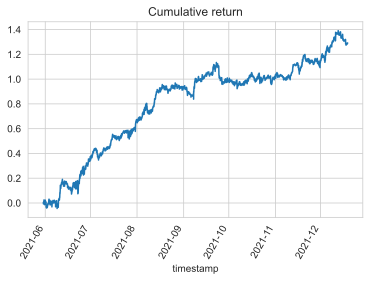

ポジション推移です。変動が細かすぎて青色一色になっていると思います。
ちゃんと全ての期間でトレードが発生しているので、正常です。


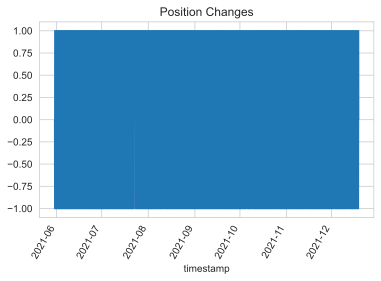

ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。


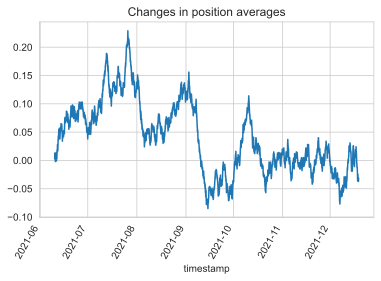

取引量(ポジション差分の絶対値)の累積です。
期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。


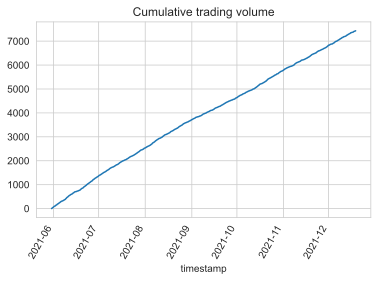

t検定
t値 3.0942901132498846
p値 0.001975651088513865
p平均法 n = 5
p平均 0.37034123480079695
エラー率 0.18141747872789227
result:  1.292408417619349


In [259]:
df = pd.read_pickle('df_fit_test_gbdt.pkl')

# バックテストで累積リターンと、ポジションを計算
df['cum_ret'], df['poss'] = backtest(
    cl=df['close'].values,
    buy_entry=df['y_pred_buy'].values > 0,
    sell_entry=df['y_pred_sell'].values > 0,
    buy_cost=df['buy_cost'].values,
    sell_cost=df['sell_cost'].values,
)
show_test_result(df=df)

#### dart

In [260]:
df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:int(len(df)*train_ratio)]
df_test = df.loc[int(len(df)*train_ratio) + 5:]

cv_indicies = list(KFold().split(df_train))

def objectives(trial):
    #==== 最適化したいパラメータ ====
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0)
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0)
    learning_rate = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    subsample = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    min_child_samples = trial.suggest_int('min_child_samples', 5, 50)
    max_depth = trial.suggest_int('max_depth', 5, 15)
    params = {
        "reg_alpha": reg_alpha,
        "reg_lambda": reg_lambda,
        "learning_rate": learning_rate,
        "colsample_bytree": colsample_bytree,
        "subsample" : subsample,
        "min_child_samples": min_child_samples,
        "max_depth": max_depth}

    model = lgb.LGBMRegressor(boosting_type='dart', random_state=1, **params)

    def calc_objective_pred(df_train):
        df_train = df_train.copy()
        df_train['y_pred_buy'] = my_cross_val_predict(model, df_train[features].values, df_train['y_buy'].values, cv=cv_indicies)
        df_train['y_pred_sell'] = my_cross_val_predict(model, df_train[features].values, df_train['y_sell'].values, cv=cv_indicies)
        return df_train

    df = calc_objective_pred(df_train=df_train)
    p_error = calc_objective_p(df=df)
    return p_error


sampler = optuna.samplers.TPESampler(seed=1)
study = optuna.create_study(sampler=sampler)
study.optimize(objectives, n_trials=200)

best_params = study.best_params
best_score = study.best_value

np.save(os.path.join(SAVE_BEST_PARAM_DIR, 'dart.npy'), best_params)

print('best score: {0}\nbest params: {1}'.format(best_score, best_params))

[I 2021-12-22 18:09:05,595] A new study created in memory with name: no-name-a5b1d306-3d68-4037-902b-e884fb7b78ad
[I 2021-12-22 18:09:36,989] Trial 0 finished with value: 0.31606320590770287 and parameters: {'reg_alpha': 5.6649755830282306e-05, 'reg_lambda': 0.030403280126677572, 'learning_rate': 0.1001029373356104, 'min_child_samples': 18, 'max_depth': 6}. Best is trial 0 with value: 0.31606320590770287.
[I 2021-12-22 18:10:27,989] Trial 1 finished with value: 0.3618906560480118 and parameters: {'reg_alpha': 6.777153976882678e-08, 'reg_lambda': 4.746154837062843e-07, 'learning_rate': 0.411004654338743, 'min_child_samples': 23, 'max_depth': 10}. Best is trial 0 with value: 0.31606320590770287.
[I 2021-12-22 18:10:55,916] Trial 2 finished with value: 0.216450642610795 and parameters: {'reg_alpha': 5.925849666609232e-05, 'reg_lambda': 0.01468843425028415, 'learning_rate': 0.2840070247583657, 'min_child_samples': 45, 'max_depth': 5}. Best is trial 2 with value: 0.216450642610795.
[I 2021-

best score: 6.050823655051695e-05
best params: {'reg_alpha': 0.19283609866511484, 'reg_lambda': 0.5339154871539189, 'learning_rate': 0.14507871486272358, 'min_child_samples': 22, 'max_depth': 9}


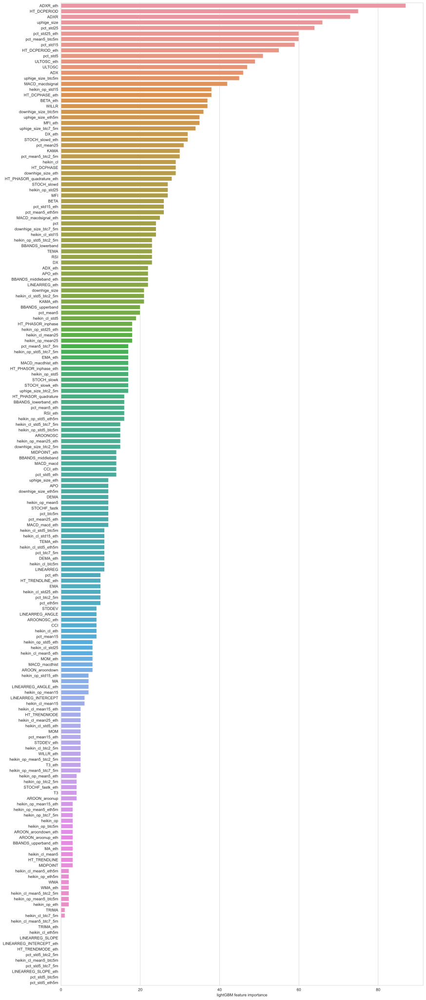

In [261]:
dart_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'dart.npy'), allow_pickle='TRUE').item()

df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:len(df)*train_ratio]
df_test = df.loc[len(df)*train_ratio + 5:]


# モデル (コメントアウトで他モデルも試してみてください)
model = lgb.LGBMRegressor(boosting_type='dart', random_state=1, **dart_params)

def model_predict(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, y_train)
    y_pred = estimator.predict(X_test)
    return y_pred

df = df_test.copy()

df['y_pred_buy'] = model_predict(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
df['y_pred_sell'] = model_predict(model, df_train[features].values, df_train['y_sell'].values, df_test[features])

# 予測値が無い(nan)行をドロップ
df = df.dropna().set_index('timestamp')
df.to_pickle('df_fit_test_dart.pkl')
_ = show_lgb_feature_importances(lgb_model=model)

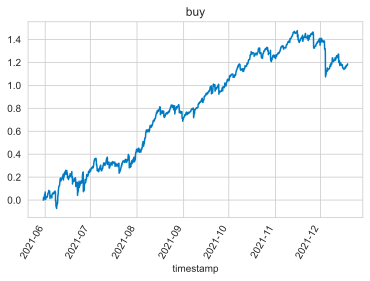

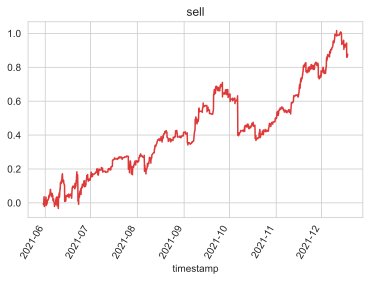

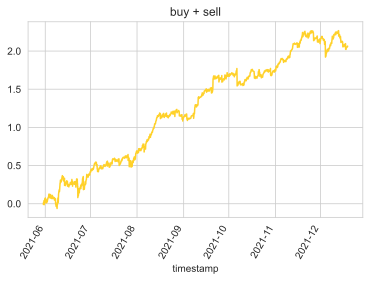

p平均法 n = 5
p平均 0.15642282596705237
エラー率 0.0024387619699504106


In [262]:
df = pd.read_pickle('df_fit_test_dart.pkl')

show_cum_ret(df=df)

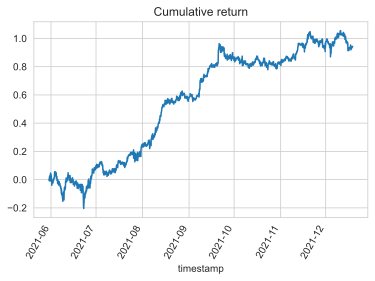

ポジション推移です。変動が細かすぎて青色一色になっていると思います。
ちゃんと全ての期間でトレードが発生しているので、正常です。


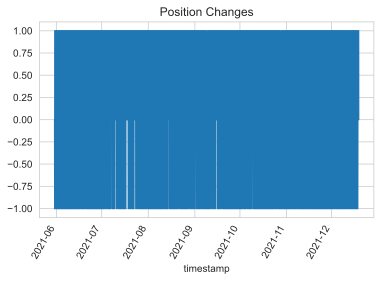

ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。


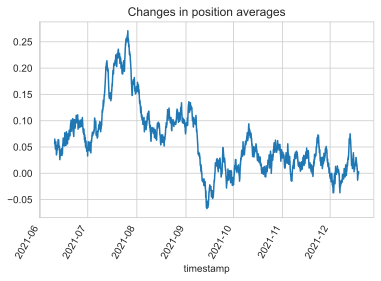

取引量(ポジション差分の絶対値)の累積です。
期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。


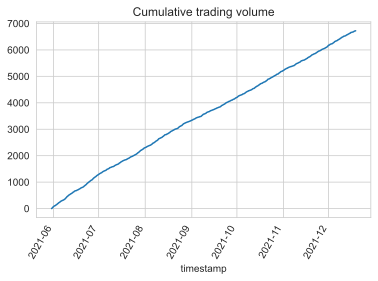

t検定
t値 2.296184250217687
p値 0.021675961576880374
p平均法 n = 5
p平均 0.5020991100440995
エラー率 0.8310287210718347
result:  0.9436403947255376


In [263]:
df = pd.read_pickle('df_fit_test_dart.pkl')

# バックテストで累積リターンと、ポジションを計算
df['cum_ret'], df['poss'] = backtest(
    cl=df['close'].values,
    buy_entry=df['y_pred_buy'].values > 0,
    sell_entry=df['y_pred_sell'].values > 0,
    buy_cost=df['buy_cost'].values,
    sell_cost=df['sell_cost'].values,
)
show_test_result(df=df)

#### goss

In [268]:
df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:int(len(df)*train_ratio)]
df_test = df.loc[int(len(df)*train_ratio) + 5:]

cv_indicies = list(KFold().split(df_train))
# ウォークフォワード法
# cv_indicies = list(TimeSeriesSplit().split(df))

def objectives(trial):
    #==== 最適化したいパラメータ ====
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0)
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0)
    learning_rate = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    subsample = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    min_child_samples = trial.suggest_int('min_child_samples', 5, 50)
    max_depth = trial.suggest_int('max_depth', 5, 15)
    params = {
        "reg_alpha": reg_alpha,
        "reg_lambda": reg_lambda,
        "learning_rate": learning_rate,
        "colsample_bytree": colsample_bytree,
        "subsample" : subsample,
        "min_child_samples": min_child_samples,
        "max_depth": max_depth}

    model = lgb.LGBMRegressor(boosting_type='goss', random_state=1, **params)

    def calc_objective_pred(df_train):
        df_train = df_train.copy()
        df_train['y_pred_buy'] = my_cross_val_predict(model, df_train[features].values, df_train['y_buy'].values, cv=cv_indicies)
        df_train['y_pred_sell'] = my_cross_val_predict(model, df_train[features].values, df_train['y_sell'].values, cv=cv_indicies)
        return df_train

    df = calc_objective_pred(df_train=df_train)
    p_error = calc_objective_p(df=df)
    return p_error


sampler = optuna.samplers.TPESampler(seed=1)
study = optuna.create_study(sampler=sampler)
study.optimize(objectives, n_trials=200)

best_params = study.best_params
best_score = study.best_value

np.save(os.path.join(SAVE_BEST_PARAM_DIR, 'goss.npy'), best_params)

print('best score: {0}\nbest params: {1}'.format(best_score, best_params))

[I 2021-12-22 21:16:36,423] A new study created in memory with name: no-name-f6eb3df8-04a4-4ed8-8dac-6b613ac174c9
[I 2021-12-22 21:16:59,422] Trial 0 finished with value: 0.29449160904894733 and parameters: {'reg_alpha': 5.6649755830282306e-05, 'reg_lambda': 0.030403280126677572, 'learning_rate': 0.1001029373356104, 'min_child_samples': 18, 'max_depth': 6}. Best is trial 0 with value: 0.29449160904894733.
[I 2021-12-22 21:17:20,745] Trial 1 finished with value: 1.2073414499078166 and parameters: {'reg_alpha': 6.777153976882678e-08, 'reg_lambda': 4.746154837062843e-07, 'learning_rate': 0.411004654338743, 'min_child_samples': 23, 'max_depth': 10}. Best is trial 0 with value: 0.29449160904894733.
[I 2021-12-22 21:17:39,475] Trial 2 finished with value: 0.2985596630392187 and parameters: {'reg_alpha': 5.925849666609232e-05, 'reg_lambda': 0.01468843425028415, 'learning_rate': 0.2840070247583657, 'min_child_samples': 45, 'max_depth': 5}. Best is trial 0 with value: 0.29449160904894733.
[I 20

best score: 0.0017749790830648914
best params: {'reg_alpha': 0.3678864246482002, 'reg_lambda': 0.12558332459690938, 'learning_rate': 0.17452862681942571, 'min_child_samples': 19, 'max_depth': 8}


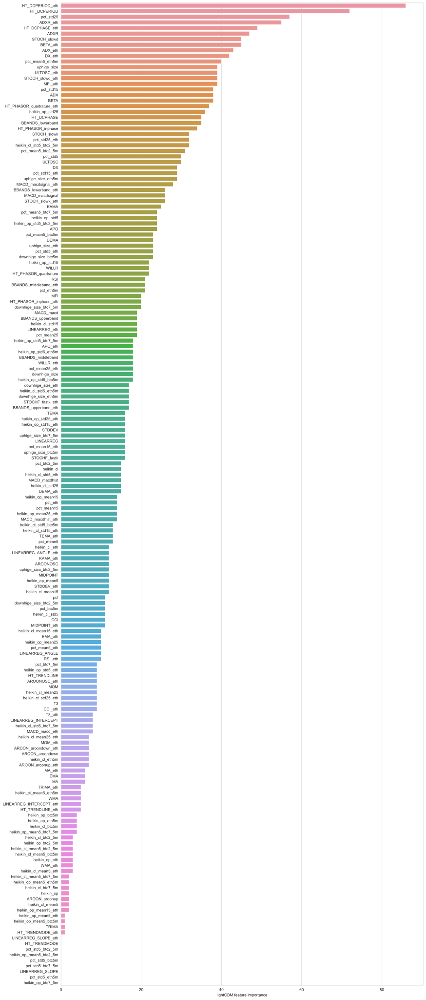

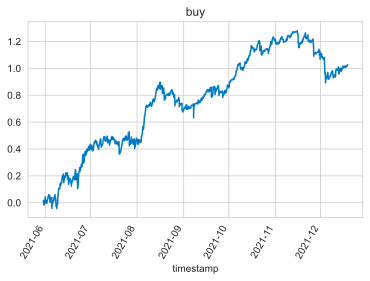

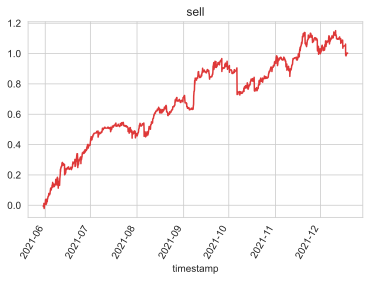

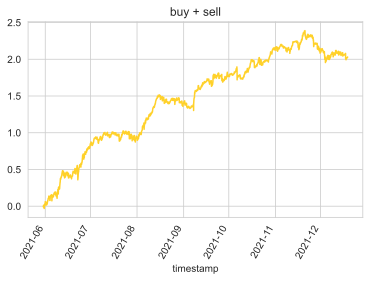

p平均法 n = 5
p平均 0.23281195838250612
エラー率 0.017811282668255386


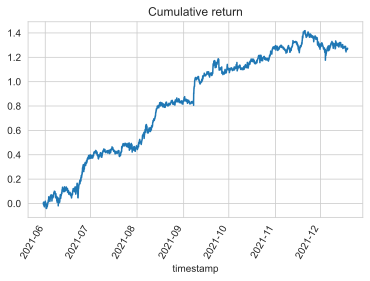

ポジション推移です。変動が細かすぎて青色一色になっていると思います。
ちゃんと全ての期間でトレードが発生しているので、正常です。


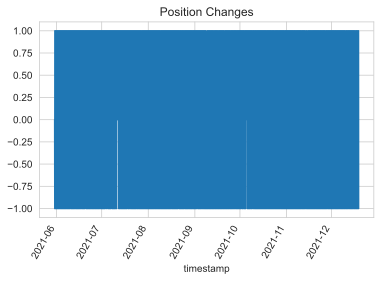

ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。


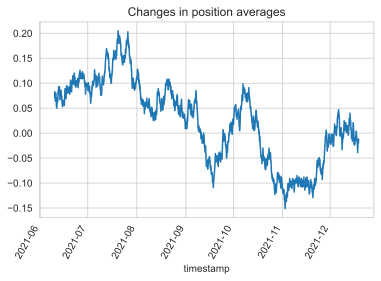

取引量(ポジション差分の絶対値)の累積です。
期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。


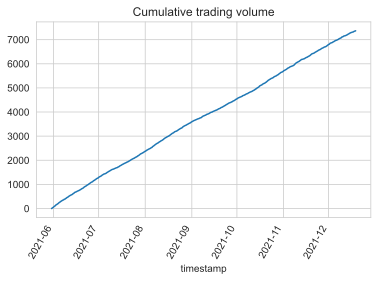

t検定
t値 3.0815425572217126
p値 0.0020621957554084274
p平均法 n = 5
p平均 0.27717449583714454
エラー率 0.04260250213342576
result:  1.2745073938246474


In [270]:
goss_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'goss.npy'), allow_pickle='TRUE').item()

df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:len(df)*train_ratio]
df_test = df.loc[len(df)*train_ratio + 5:]


# モデル (コメントアウトで他モデルも試してみてください)
model = lgb.LGBMRegressor(boosting_type='goss', random_state=1, **goss_params)

def model_predict(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, y_train)
    y_pred = estimator.predict(X_test)
    return y_pred

df = df_test.copy()

df['y_pred_buy'] = model_predict(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
df['y_pred_sell'] = model_predict(model, df_train[features].values, df_train['y_sell'].values, df_test[features])

# 予測値が無い(nan)行をドロップ
df = df.dropna().set_index('timestamp')
_ = show_lgb_feature_importances(lgb_model=model)
show_cum_ret(df=df)
# バックテストで累積リターンと、ポジションを計算
df['cum_ret'], df['poss'] = backtest(
    cl=df['close'].values,
    buy_entry=df['y_pred_buy'].values > 0,
    sell_entry=df['y_pred_sell'].values > 0,
    buy_cost=df['buy_cost'].values,
    sell_cost=df['sell_cost'].values,
)
show_test_result(df=df)

#### Ridge

X has feature names, but ElasticNet was fitted without feature names
X has feature names, but ElasticNet was fitted without feature names


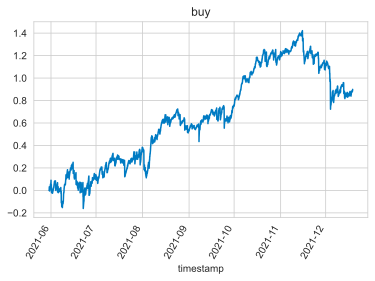

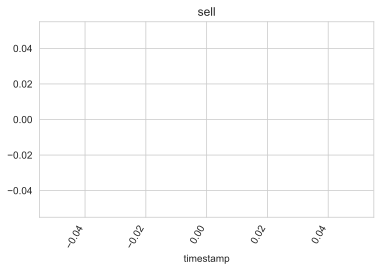

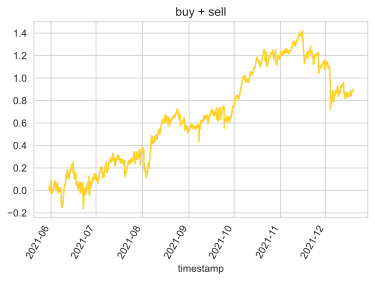

p平均法 n = 5
p平均 0.46531665252974863
エラー率 0.5680829453030259


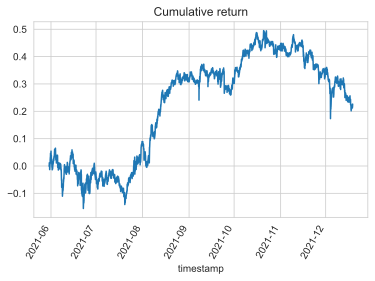

ポジション推移です。変動が細かすぎて青色一色になっていると思います。
ちゃんと全ての期間でトレードが発生しているので、正常です。


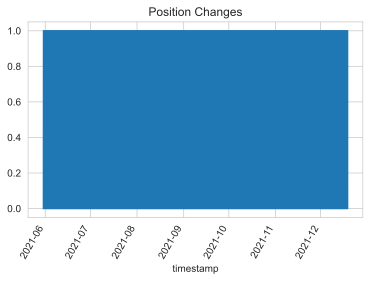

ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。


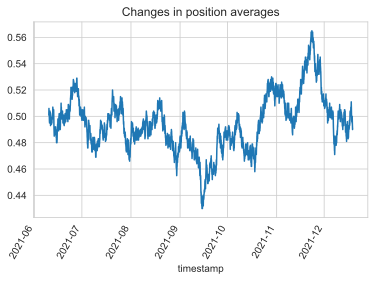

取引量(ポジション差分の絶対値)の累積です。
期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。


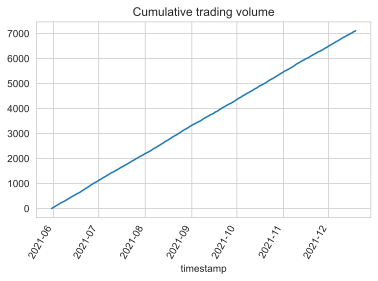

t検定
t値 0.589739766905497
p値 0.5553720009575303
p平均法 n = 5
p平均 0.6598918467727222
エラー率 3.25861151761683
result:  0.22625962593047896


In [299]:
df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:len(df)*train_ratio]
df_test = df.loc[len(df)*train_ratio + 5:]


# モデル (コメントアウトで他モデルも試してみてください)
model = ElasticNet(random_state=1)


def model_predict(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, y_train)
    y_pred = estimator.predict(X_test)
    return y_pred

df = df_test.copy()

df['y_pred_buy'] = model_predict(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
df['y_pred_sell'] = model_predict(model, df_train[features].values, df_train['y_sell'].values, df_test[features])

# 予測値が無い(nan)行をドロップ
df = df.dropna().set_index('timestamp')
# show_shap(df=df_train, model=model)
show_cum_ret(df=df)
# バックテストで累積リターンと、ポジションを計算
df['cum_ret'], df['poss'] = backtest(
    cl=df['close'].values,
    buy_entry=df['y_pred_buy'].values > 0,
    sell_entry=df['y_pred_sell'].values > 0,
    buy_cost=df['buy_cost'].values,
    sell_cost=df['sell_cost'].values,
)
show_test_result(df=df)

## 分類

In [275]:
def my_cross_val_predict_class(estimator, X, y=None, cv=None):
    y_pred = y.copy()
    y_pred[:] = np.nan
    for train_idx, val_idx in cv:
        estimator.fit(X[train_idx], np.sign(y[train_idx]), sample_weight=np.abs(y[train_idx]))
        y_pred[val_idx] = estimator.predict(X[val_idx])
    return y_pred

#### gbdt_class

In [276]:
df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:int(len(df)*train_ratio)]
df_test = df.loc[int(len(df)*train_ratio) + 5:]

cv_indicies = list(KFold().split(df_train))


def objectives(trial):
    #==== 最適化したいパラメータ ====
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0)
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0)
    learning_rate = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    subsample = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    min_child_samples = trial.suggest_int('min_child_samples', 5, 50)
    max_depth = trial.suggest_int('max_depth', 5, 15)
    params = {
        "reg_alpha": reg_alpha,
        "reg_lambda": reg_lambda,
        "learning_rate": learning_rate,
        "colsample_bytree": colsample_bytree,
        "subsample" : subsample,
        "min_child_samples": min_child_samples,
        "max_depth": max_depth}

    model = lgb.LGBMClassifier(boosting_type='gbdt', random_state=1, **params)

    def calc_objective_pred(df_train):
        df_train = df_train.copy()
        df_train['y_pred_buy'] = my_cross_val_predict_class(model, df_train[features].values, df_train['y_buy'].values, cv=cv_indicies)
        df_train['y_pred_sell'] = my_cross_val_predict_class(model, df_train[features].values, df_train['y_sell'].values, cv=cv_indicies)
        return df_train

    df = calc_objective_pred(df_train=df_train)
    p_error = calc_objective_p(df=df)
    return p_error


sampler = optuna.samplers.TPESampler(seed=1)
study = optuna.create_study(sampler=sampler)
study.optimize(objectives, n_trials=200)

best_params = study.best_params
best_score = study.best_value

np.save(os.path.join(SAVE_BEST_PARAM_DIR, 'gbdt_class.npy'), best_params)

print('best score: {0}\nbest params: {1}'.format(best_score, best_params))

[I 2021-12-22 23:01:08,893] A new study created in memory with name: no-name-12262b95-512f-419b-893c-c6c5b5188ffd
[I 2021-12-22 23:01:34,745] Trial 0 finished with value: 0.021474450331270985 and parameters: {'reg_alpha': 5.6649755830282306e-05, 'reg_lambda': 0.030403280126677572, 'learning_rate': 0.1001029373356104, 'min_child_samples': 18, 'max_depth': 6}. Best is trial 0 with value: 0.021474450331270985.
[I 2021-12-22 23:02:12,323] Trial 1 finished with value: 1.4439384175113852 and parameters: {'reg_alpha': 6.777153976882678e-08, 'reg_lambda': 4.746154837062843e-07, 'learning_rate': 0.411004654338743, 'min_child_samples': 23, 'max_depth': 10}. Best is trial 0 with value: 0.021474450331270985.
[I 2021-12-22 23:02:41,641] Trial 2 finished with value: 0.9801965473606947 and parameters: {'reg_alpha': 5.925849666609232e-05, 'reg_lambda': 0.01468843425028415, 'learning_rate': 0.2840070247583657, 'min_child_samples': 45, 'max_depth': 5}. Best is trial 0 with value: 0.021474450331270985.
[

best score: 0.0021560940547722357
best params: {'reg_alpha': 1.8009166712129824e-06, 'reg_lambda': 9.620046553088986, 'learning_rate': 0.23866468006590635, 'min_child_samples': 5, 'max_depth': 9}


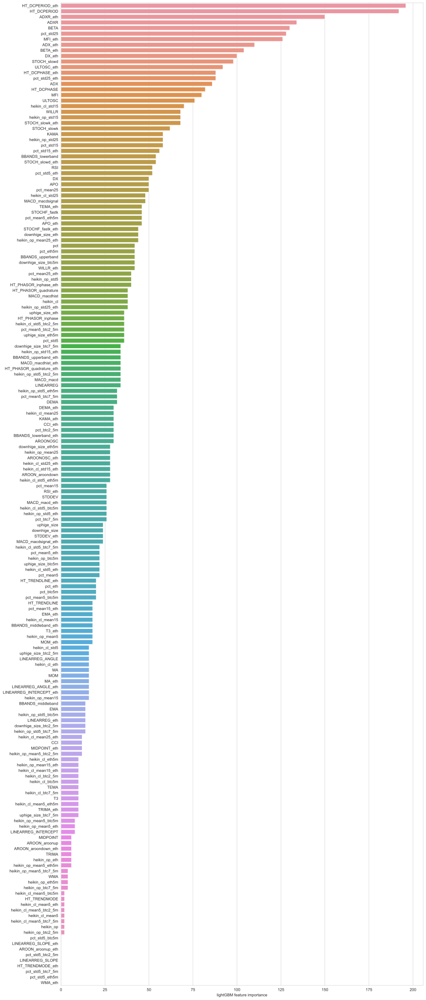

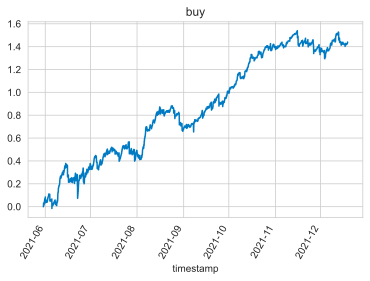

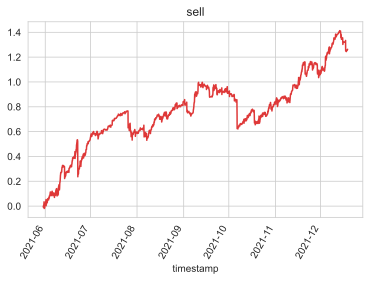

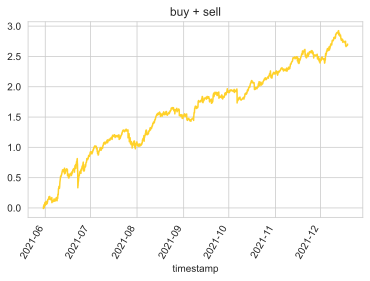

p平均法 n = 5
p平均 0.0559290247689576
エラー率 1.4251317273247792e-05


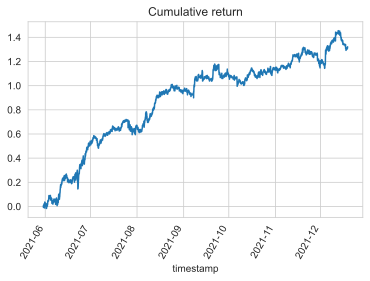

ポジション推移です。変動が細かすぎて青色一色になっていると思います。
ちゃんと全ての期間でトレードが発生しているので、正常です。


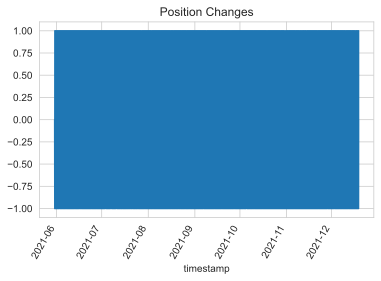

ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。


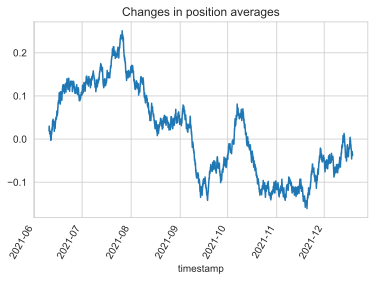

取引量(ポジション差分の絶対値)の累積です。
期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。


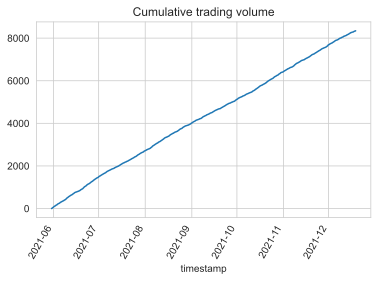

t検定
t値 3.057129992855478
p値 0.0022377145753016735
p平均法 n = 5
p平均 0.31339530462825216
エラー率 0.07872835968583643
result:  1.3214371319058877


In [277]:
gbdt_class_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'gbdt_class.npy'), allow_pickle='TRUE').item()

df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:len(df)*train_ratio]
df_test = df.loc[len(df)*train_ratio + 5:]


# モデル (コメントアウトで他モデルも試してみてください)
model = lgb.LGBMClassifier(boosting_type='gbdt', random_state=1, **gbdt_class_params)

def model_predict(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, np.sign(y_train), sample_weight=np.abs(y_train))
    y_pred = estimator.predict(X_test)
    return y_pred

df = df_test.copy()

df['y_pred_buy'] = model_predict(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
df['y_pred_sell'] = model_predict(model, df_train[features].values, df_train['y_sell'].values, df_test[features])

# 予測値が無い(nan)行をドロップ
df = df.dropna().set_index('timestamp')
_ = show_lgb_feature_importances(lgb_model=model)
show_cum_ret(df=df)
# バックテストで累積リターンと、ポジションを計算
df['cum_ret'], df['poss'] = backtest(
    cl=df['close'].values,
    buy_entry=df['y_pred_buy'].values > 0,
    sell_entry=df['y_pred_sell'].values > 0,
    buy_cost=df['buy_cost'].values,
    sell_cost=df['sell_cost'].values,
)
show_test_result(df=df)

#### dart_class

In [301]:
df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:int(len(df)*train_ratio)]
df_test = df.loc[int(len(df)*train_ratio) + 5:]

cv_indicies = list(KFold().split(df_train))


def objectives(trial):
    #==== 最適化したいパラメータ ====
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0)
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0)
    learning_rate = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    subsample = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    min_child_samples = trial.suggest_int('min_child_samples', 5, 50)
    max_depth = trial.suggest_int('max_depth', 5, 15)
    params = {
        "reg_alpha": reg_alpha,
        "reg_lambda": reg_lambda,
        "learning_rate": learning_rate,
        "colsample_bytree": colsample_bytree,
        "subsample" : subsample,
        "min_child_samples": min_child_samples,
        "max_depth": max_depth}

    model = lgb.LGBMClassifier(boosting_type='dart', random_state=1, **params)

    def calc_objective_pred(df_train):
        df_train = df_train.copy()
        df_train['y_pred_buy'] = my_cross_val_predict_class(model, df_train[features].values, df_train['y_buy'].values, cv=cv_indicies)
        df_train['y_pred_sell'] = my_cross_val_predict_class(model, df_train[features].values, df_train['y_sell'].values, cv=cv_indicies)
        return df_train

    df = calc_objective_pred(df_train=df_train)
    p_error = calc_objective_p(df=df)
    return p_error


sampler = optuna.samplers.TPESampler(seed=1)
study = optuna.create_study(sampler=sampler)
study.optimize(objectives, n_trials=200)

best_params = study.best_params
best_score = study.best_value

np.save(os.path.join(SAVE_BEST_PARAM_DIR, 'dart_class.npy'), best_params)

print('best score: {0}\nbest params: {1}'.format(best_score, best_params))

[I 2021-12-23 01:56:30,350] A new study created in memory with name: no-name-b8c76b07-de0f-4aa0-a407-5bc2b6b6a3b2
[I 2021-12-23 01:57:15,430] Trial 0 finished with value: 0.0626016941258287 and parameters: {'reg_alpha': 5.6649755830282306e-05, 'reg_lambda': 0.030403280126677572, 'learning_rate': 0.1001029373356104, 'min_child_samples': 18, 'max_depth': 6}. Best is trial 0 with value: 0.0626016941258287.
[I 2021-12-23 01:57:57,510] Trial 1 finished with value: 0.23934921057155015 and parameters: {'reg_alpha': 6.777153976882678e-08, 'reg_lambda': 4.746154837062843e-07, 'learning_rate': 0.411004654338743, 'min_child_samples': 23, 'max_depth': 10}. Best is trial 0 with value: 0.0626016941258287.
[I 2021-12-23 01:58:27,905] Trial 2 finished with value: 0.028166659600097763 and parameters: {'reg_alpha': 5.925849666609232e-05, 'reg_lambda': 0.01468843425028415, 'learning_rate': 0.2840070247583657, 'min_child_samples': 45, 'max_depth': 5}. Best is trial 2 with value: 0.028166659600097763.
[I 2

best score: 0.00015320565126987904
best params: {'reg_alpha': 0.028744817457634665, 'reg_lambda': 3.0871421630275155, 'learning_rate': 0.2704730630613511, 'min_child_samples': 30, 'max_depth': 6}


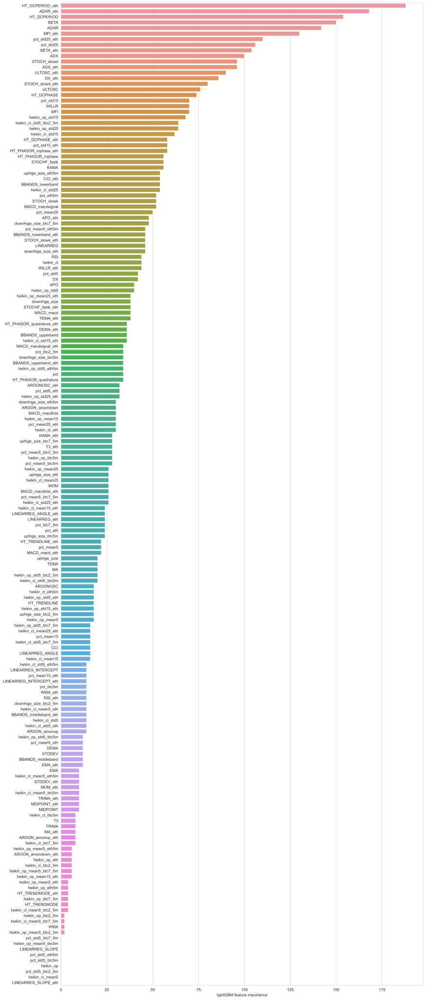

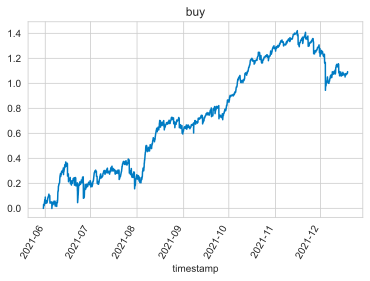

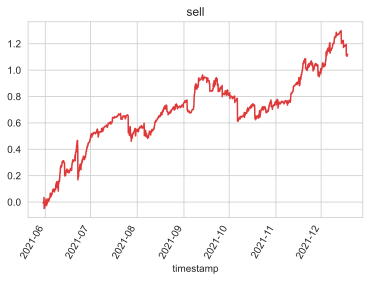

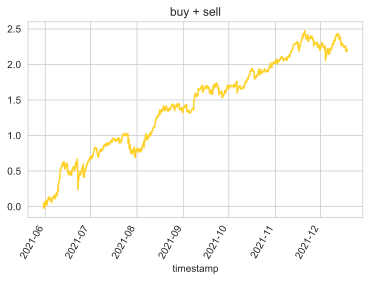

p平均法 n = 5
p平均 0.1849495536458515
エラー率 0.00563553580385811


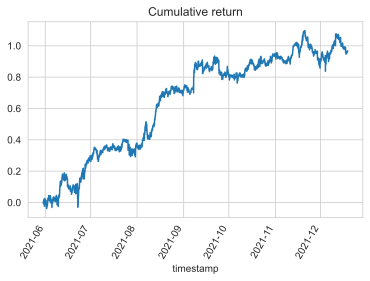

ポジション推移です。変動が細かすぎて青色一色になっていると思います。
ちゃんと全ての期間でトレードが発生しているので、正常です。


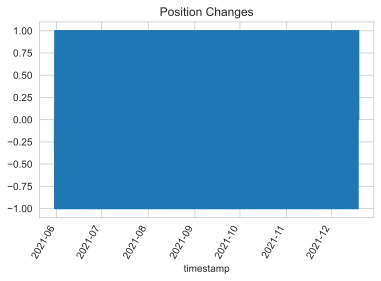

ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。


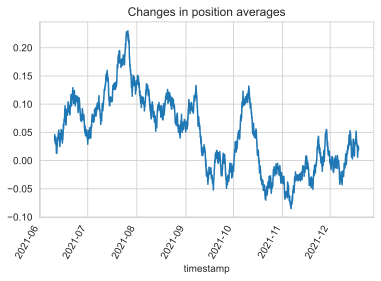

取引量(ポジション差分の絶対値)の累積です。
期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。


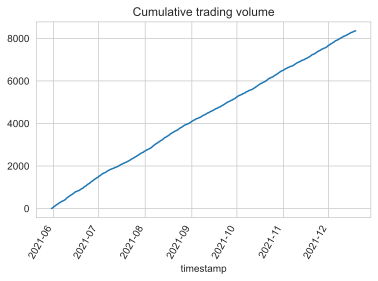

t検定
t値 2.1701587502156094
p値 0.030006919433420036
p平均法 n = 5
p平均 0.4192279055036149
エラー率 0.33722494483749205
result:  0.9676094334537466


In [303]:
dart_class_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'dart_class.npy'), allow_pickle='TRUE').item()

df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:len(df)*train_ratio]
df_test = df.loc[len(df)*train_ratio + 5:]


# モデル (コメントアウトで他モデルも試してみてください)
model = lgb.LGBMClassifier(boosting_type='dart', random_state=1, **dart_class_params)

def model_predict(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, np.sign(y_train), sample_weight=np.abs(y_train))
    y_pred = estimator.predict(X_test)
    return y_pred

df = df_test.copy()

df['y_pred_buy'] = model_predict(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
df['y_pred_sell'] = model_predict(model, df_train[features].values, df_train['y_sell'].values, df_test[features])

# 予測値が無い(nan)行をドロップ
df = df.dropna().set_index('timestamp')
_ = show_lgb_feature_importances(lgb_model=model)
show_cum_ret(df=df)
# バックテストで累積リターンと、ポジションを計算
df['cum_ret'], df['poss'] = backtest(
    cl=df['close'].values,
    buy_entry=df['y_pred_buy'].values > 0,
    sell_entry=df['y_pred_sell'].values > 0,
    buy_cost=df['buy_cost'].values,
    sell_cost=df['sell_cost'].values,
)
show_test_result(df=df)

#### goss_class

In [302]:
df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:int(len(df)*train_ratio)]
df_test = df.loc[int(len(df)*train_ratio) + 5:]

cv_indicies = list(KFold().split(df_train))


def objectives(trial):
    #==== 最適化したいパラメータ ====
    reg_alpha = trial.suggest_loguniform('reg_alpha', 1e-8, 10.0)
    reg_lambda = trial.suggest_loguniform('reg_lambda', 1e-8, 10.0)
    learning_rate = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    colsample_bytree = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    subsample = trial.suggest_uniform('learning_rate', 0.1, 1.0)
    min_child_samples = trial.suggest_int('min_child_samples', 5, 50)
    max_depth = trial.suggest_int('max_depth', 5, 15)
    params = {
        "reg_alpha": reg_alpha,
        "reg_lambda": reg_lambda,
        "learning_rate": learning_rate,
        "colsample_bytree": colsample_bytree,
        "subsample" : subsample,
        "min_child_samples": min_child_samples,
        "max_depth": max_depth}

    model = lgb.LGBMClassifier(boosting_type='goss', random_state=1, **params)

    def calc_objective_pred(df_train):
        df_train = df_train.copy()
        df_train['y_pred_buy'] = my_cross_val_predict_class(model, df_train[features].values, df_train['y_buy'].values, cv=cv_indicies)
        df_train['y_pred_sell'] = my_cross_val_predict_class(model, df_train[features].values, df_train['y_sell'].values, cv=cv_indicies)
        return df_train

    df = calc_objective_pred(df_train=df_train)
    p_error = calc_objective_p(df=df)
    return p_error


sampler = optuna.samplers.TPESampler(seed=1)
study = optuna.create_study(sampler=sampler)
study.optimize(objectives, n_trials=200)

best_params = study.best_params
best_score = study.best_value

np.save(os.path.join(SAVE_BEST_PARAM_DIR, 'goss_class.npy'), best_params)

print('best score: {0}\nbest params: {1}'.format(best_score, best_params))

[I 2021-12-23 04:13:03,347] A new study created in memory with name: no-name-972dcc66-6f02-4d8e-baa1-f2645ffb3420
[I 2021-12-23 04:13:24,334] Trial 0 finished with value: 0.03887428811149576 and parameters: {'reg_alpha': 5.6649755830282306e-05, 'reg_lambda': 0.030403280126677572, 'learning_rate': 0.1001029373356104, 'min_child_samples': 18, 'max_depth': 6}. Best is trial 0 with value: 0.03887428811149576.
[I 2021-12-23 04:13:49,176] Trial 1 finished with value: 1.3427981604495542 and parameters: {'reg_alpha': 6.777153976882678e-08, 'reg_lambda': 4.746154837062843e-07, 'learning_rate': 0.411004654338743, 'min_child_samples': 23, 'max_depth': 10}. Best is trial 0 with value: 0.03887428811149576.
[I 2021-12-23 04:14:08,226] Trial 2 finished with value: 0.1299871774959584 and parameters: {'reg_alpha': 5.925849666609232e-05, 'reg_lambda': 0.01468843425028415, 'learning_rate': 0.2840070247583657, 'min_child_samples': 45, 'max_depth': 5}. Best is trial 0 with value: 0.03887428811149576.
[I 20

best score: 0.002280862016424505
best params: {'reg_alpha': 1.093526479476429e-08, 'reg_lambda': 2.931572677116376, 'learning_rate': 0.20985464137504062, 'min_child_samples': 15, 'max_depth': 9}


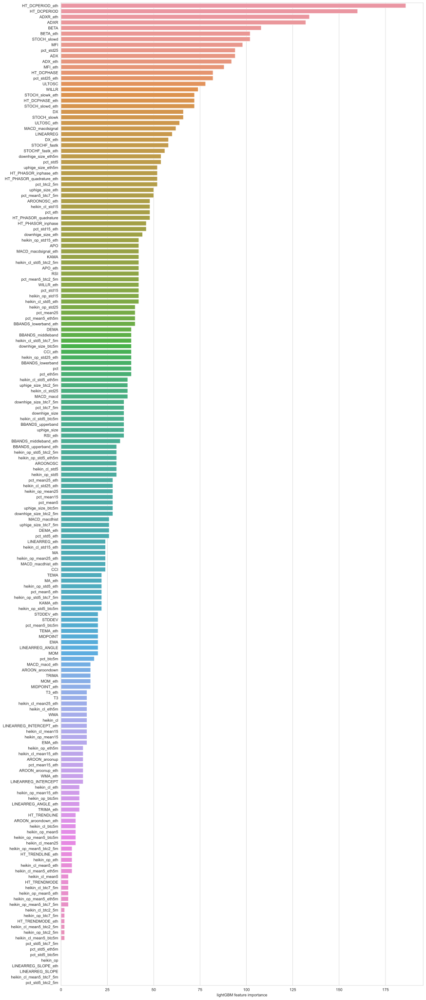

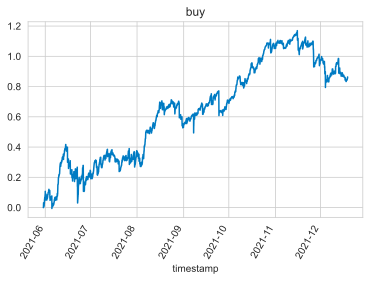

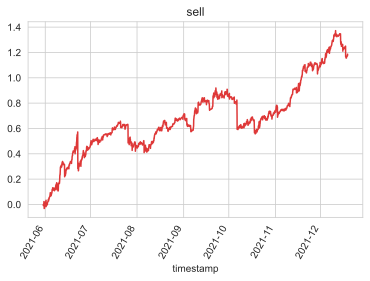

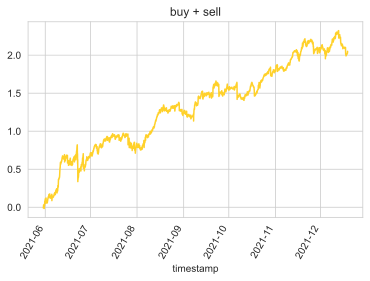

p平均法 n = 5
p平均 0.18315080045919463
エラー率 0.00536676873504609


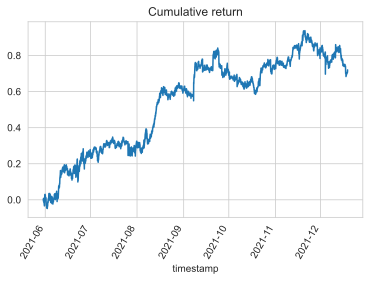

ポジション推移です。変動が細かすぎて青色一色になっていると思います。
ちゃんと全ての期間でトレードが発生しているので、正常です。


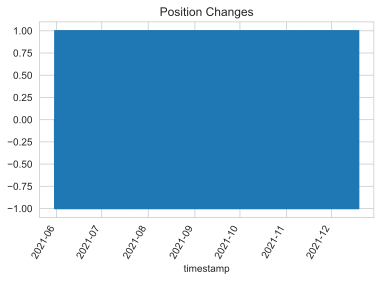

ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。


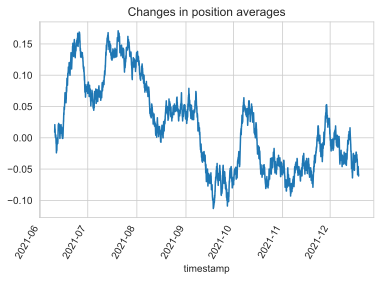

取引量(ポジション差分の絶対値)の累積です。
期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。


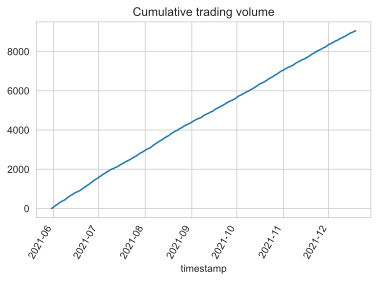

t検定
t値 1.5809660790778641
p値 0.11390210289819064
p平均法 n = 5
p平均 0.561794224598718
エラー率 1.457320676524502
result:  0.7199095182453381


In [304]:
dart_class_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'goss_class.npy'), allow_pickle='TRUE').item()

df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:len(df)*train_ratio]
df_test = df.loc[len(df)*train_ratio + 5:]


# モデル (コメントアウトで他モデルも試してみてください)
model = lgb.LGBMClassifier(boosting_type='goss', random_state=1, **dart_class_params)

def model_predict(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, np.sign(y_train), sample_weight=np.abs(y_train))
    y_pred = estimator.predict(X_test)
    return y_pred

df = df_test.copy()

df['y_pred_buy'] = model_predict(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
df['y_pred_sell'] = model_predict(model, df_train[features].values, df_train['y_sell'].values, df_test[features])

# 予測値が無い(nan)行をドロップ
df = df.dropna().set_index('timestamp')
_ = show_lgb_feature_importances(lgb_model=model)
show_cum_ret(df=df)
# バックテストで累積リターンと、ポジションを計算
df['cum_ret'], df['poss'] = backtest(
    cl=df['close'].values,
    buy_entry=df['y_pred_buy'].values > 0,
    sell_entry=df['y_pred_sell'].values > 0,
    buy_cost=df['buy_cost'].values,
    sell_cost=df['sell_cost'].values,
)
show_test_result(df=df)

# Blending

In [305]:
df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:int(len(df)*train_ratio)]
df_test = df.loc[int(len(df)*train_ratio) + 5:]

gbdt_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'gbdt.npy'), allow_pickle='TRUE').item()
dart_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'dart.npy'), allow_pickle='TRUE').item()
goss_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'goss.npy'), allow_pickle='TRUE').item()
gbdt_class_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'gbdt_class.npy'), allow_pickle='TRUE').item()
dart_class_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'dart_class.npy'), allow_pickle='TRUE').item()
goss_class_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'goss_class.npy'), allow_pickle='TRUE').item()

regression_models = []
classification_models = []

regression_models.append(lgb.LGBMRegressor(boosting_type='gbdt', random_state=1, **gbdt_params))
regression_models.append(lgb.LGBMRegressor(boosting_type='dart', random_state=1, **dart_params))
regression_models.append(lgb.LGBMRegressor(boosting_type='goss', random_state=1, **goss_params))
regression_models.append(RidgeCV(alphas=np.logspace(-7, 7, num=20)))
classification_models.append(lgb.LGBMClassifier(boosting_type='gbdt', random_state=1, **gbdt_class_params))
classification_models.append(lgb.LGBMClassifier(boosting_type='dart', random_state=1, **dart_class_params))
classification_models.append(lgb.LGBMClassifier(boosting_type='goss', random_state=1, **goss_class_params))


def model_predict(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, y_train)
    y_pred = estimator.predict(X_test)
    return y_pred


def model_predict_class(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, np.sign(y_train), sample_weight=np.abs(y_train))
    y_pred = estimator.predict(X_test)
    return y_pred


buy_preds = []
sell_preds = []


for model in regression_models:
    buy_pred = model_predict(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
    sell_pred = model_predict(model, df_train[features].values, df_train['y_sell'].values, df_test[features])
    buy_preds.append(np.sign(buy_pred))
    sell_preds.append(np.sign(sell_pred))

for model in classification_models:
    buy_pred = model_predict_class(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
    sell_pred = model_predict_class(model, df_train[features].values, df_train['y_sell'].values, df_test[features])
    buy_preds.append(buy_pred)
    sell_preds.append(sell_pred)


df_test['y_pred_buy'] = np.average(buy_preds, axis=0)
df_test['y_pred_sell'] = np.average(sell_preds, axis=0)

df_test = df_test.dropna().set_index('timestamp')
df_test.to_pickle('df_fit_test_blend.pkl')

X has feature names, but RidgeCV was fitted without feature names
X has feature names, but RidgeCV was fitted without feature names

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


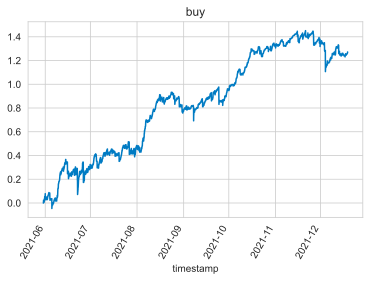

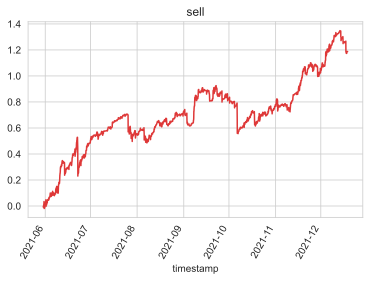

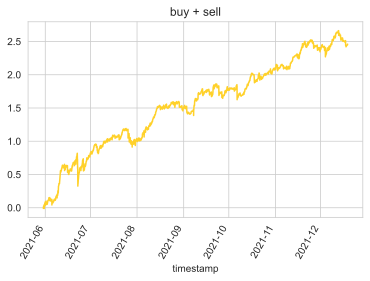

p平均法 n = 5
p平均 0.0971955974286452
エラー率 0.00022589246442950302


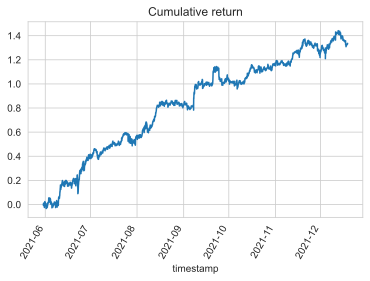

ポジション推移です。変動が細かすぎて青色一色になっていると思います。
ちゃんと全ての期間でトレードが発生しているので、正常です。


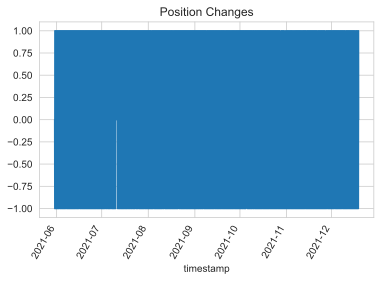

ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。


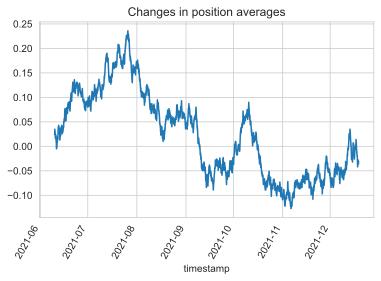

取引量(ポジション差分の絶対値)の累積です。
期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。


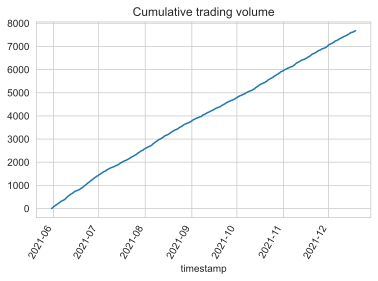

t検定
t値 3.0913894124438888
p値 0.001995045843270885
p平均法 n = 5
p平均 0.23059264000695928
エラー率 0.016978369585003785
result:  1.3361354225657107


In [306]:
df = pd.read_pickle('df_fit_test_blend.pkl')

show_cum_ret(df=df)
# バックテストで累積リターンと、ポジションを計算
df['cum_ret'], df['poss'] = backtest(
    cl=df['close'].values,
    buy_entry=df['y_pred_buy'].values > 0,
    sell_entry=df['y_pred_sell'].values > 0,
    buy_cost=df['buy_cost'].values,
    sell_cost=df['sell_cost'].values,
)
show_test_result(df=df)

#### 重み最適化

In [316]:
def calc_blending_objective(df, buy_preds, sell_preds, weights):
    df = df.copy()
    df['y_pred_buy'] = np.average(buy_preds, axis=0, weights=weights)
    df['y_pred_sell'] = np.average(sell_preds, axis=0, weights=weights)
    p_error = calc_objective_p(df=df)
    return p_error

In [317]:
df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:int(len(df)*train_ratio)]
df_test = df.loc[int(len(df)*train_ratio) + 5:]

gbdt_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'gbdt.npy'), allow_pickle='TRUE').item()
dart_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'dart.npy'), allow_pickle='TRUE').item()
goss_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'goss.npy'), allow_pickle='TRUE').item()
gbdt_class_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'gbdt_class.npy'), allow_pickle='TRUE').item()
dart_class_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'dart_class.npy'), allow_pickle='TRUE').item()
goss_class_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'goss_class.npy'), allow_pickle='TRUE').item()

regression_models = []
classification_models = []

regression_models.append(lgb.LGBMRegressor(boosting_type='gbdt', random_state=1, **gbdt_params))
regression_models.append(lgb.LGBMRegressor(boosting_type='dart', random_state=1, **dart_params))
regression_models.append(lgb.LGBMRegressor(boosting_type='goss', random_state=1, **goss_params))
regression_models.append(RidgeCV(alphas=np.logspace(-7, 7, num=20)))
classification_models.append(lgb.LGBMClassifier(boosting_type='gbdt', random_state=1, **gbdt_class_params))
classification_models.append(lgb.LGBMClassifier(boosting_type='dart', random_state=1, **dart_class_params))
classification_models.append(lgb.LGBMClassifier(boosting_type='goss', random_state=1, **goss_class_params))


# 通常のCV
cv_indicies = list(KFold().split(df_train))

buy_preds = []
sell_preds = []

for model in regression_models:
    buy_pred = my_cross_val_predict(model, df_train[features].values, df_train['y_buy'].values, cv=cv_indicies)
    buy_preds.append(np.sign(buy_pred))
    sell_pred = my_cross_val_predict(model, df_train[features].values, df_train['y_sell'].values, cv=cv_indicies)
    sell_preds.append(np.sign(sell_pred))

for model in classification_models:
    buy_pred = my_cross_val_predict_class(model, df_train[features].values, df_train['y_buy'].values, cv=cv_indicies)
    buy_preds.append(buy_pred)
    sell_pred = my_cross_val_predict_class(model, df_train[features].values, df_train['y_sell'].values, cv=cv_indicies)
    sell_preds.append(sell_pred)

In [318]:
class Objective:
    def __init__(self, num_models):
        self.num_models = num_models

    def __call__(self, trial):
        weights = [trial.suggest_uniform('weight' + str(n), 0, 1) for n in range(self.num_models)]
        return calc_blending_objective(df=df_train, buy_preds=buy_preds, sell_preds=sell_preds, weights=weights)

objective = Objective(num_models = len(regression_models) + len(classification_models))

sampler = optuna.samplers.TPESampler(seed=1)
study = optuna.create_study(sampler=sampler)
study.optimize(objective, n_trials=1000)


best_weights = list(study.best_params.values())
best_weights = np.array(best_weights) / np.sum(best_weights)  # 重みを規格化
best_score = study.best_value

np.save(os.path.join(SAVE_BEST_PARAM_DIR, 'blending_weights.npy'), best_weights)

print('best score: {0}\nbest weight: {1}'.format(best_score, best_weights))

[I 2021-12-23 10:59:30,633] A new study created in memory with name: no-name-04ba30f7-7ebf-40da-8fec-734aeda5c192
[I 2021-12-23 10:59:31,603] Trial 0 finished with value: 0.09098691539986643 and parameters: {'weight0': 0.417022004702574, 'weight1': 0.7203244934421581, 'weight2': 0.00011437481734488664, 'weight3': 0.30233257263183977, 'weight4': 0.14675589081711304, 'weight5': 0.0923385947687978, 'weight6': 0.1862602113776709}. Best is trial 0 with value: 0.09098691539986643.
[I 2021-12-23 10:59:31,911] Trial 1 finished with value: 0.03513689349673404 and parameters: {'weight0': 0.34556072704304774, 'weight1': 0.39676747423066994, 'weight2': 0.538816734003357, 'weight3': 0.4191945144032948, 'weight4': 0.6852195003967595, 'weight5': 0.20445224973151743, 'weight6': 0.8781174363909454}. Best is trial 1 with value: 0.03513689349673404.
[I 2021-12-23 10:59:32,217] Trial 2 finished with value: 0.011021751900126185 and parameters: {'weight0': 0.027387593197926163, 'weight1': 0.6704675101784022

best score: 0.0036808343924398714
best weight: [0.02495414 0.15849577 0.15121276 0.20176527 0.09417361 0.24952808
 0.11987037]


In [319]:
df = pd.read_pickle('df_y.pkl')
df = df.dropna()
df = df.reset_index()

train_ratio = 0.75
df_train = df.loc[:int(len(df)*train_ratio)]
df_test = df.loc[int(len(df)*train_ratio) + 5:]

gbdt_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'gbdt.npy'), allow_pickle='TRUE').item()
dart_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'dart.npy'), allow_pickle='TRUE').item()
goss_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'goss.npy'), allow_pickle='TRUE').item()
gbdt_class_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'gbdt_class.npy'), allow_pickle='TRUE').item()
dart_class_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'dart_class.npy'), allow_pickle='TRUE').item()
goss_class_params : Dict[str, float] = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'goss_class.npy'), allow_pickle='TRUE').item()

regression_models = []
classification_models = []

regression_models.append(lgb.LGBMRegressor(boosting_type='gbdt', random_state=1, **gbdt_params))
regression_models.append(lgb.LGBMRegressor(boosting_type='dart', random_state=1, **dart_params))
regression_models.append(lgb.LGBMRegressor(boosting_type='goss', random_state=1, **goss_params))
regression_models.append(RidgeCV(alphas=np.logspace(-7, 7, num=20)))
classification_models.append(lgb.LGBMClassifier(boosting_type='gbdt', random_state=1, **gbdt_class_params))
classification_models.append(lgb.LGBMClassifier(boosting_type='dart', random_state=1, **dart_class_params))
classification_models.append(lgb.LGBMClassifier(boosting_type='goss', random_state=1, **goss_class_params))


def model_predict(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, y_train)
    y_pred = estimator.predict(X_test)
    return y_pred


def model_predict_class(estimator, X_train, y_train, X_test):
    estimator.fit(X_train, np.sign(y_train), sample_weight=np.abs(y_train))
    y_pred = estimator.predict(X_test)
    return y_pred


buy_preds = []
sell_preds = []


for model in regression_models:
    buy_pred = model_predict(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
    sell_pred = model_predict(model, df_train[features].values, df_train['y_sell'].values, df_test[features])
    buy_preds.append(np.sign(buy_pred))
    sell_preds.append(np.sign(sell_pred))

for model in classification_models:
    buy_pred = model_predict_class(model, df_train[features].values, df_train['y_buy'].values, df_test[features])
    sell_pred = model_predict_class(model, df_train[features].values, df_train['y_sell'].values, df_test[features])
    buy_preds.append(buy_pred)
    sell_preds.append(sell_pred)


best_weights = np.load(os.path.join(SAVE_BEST_PARAM_DIR, 'blending_weights.npy'), allow_pickle='TRUE')

df_test['y_pred_buy'] = np.average(buy_preds, axis=0, weights=best_weights)
df_test['y_pred_sell'] = np.average(sell_preds, axis=0, weights=best_weights)

df_test = df_test.dropna().set_index('timestamp')
df_test.to_pickle('df_fit_test_blend_opt.pkl')

X has feature names, but RidgeCV was fitted without feature names
X has feature names, but RidgeCV was fitted without feature names

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


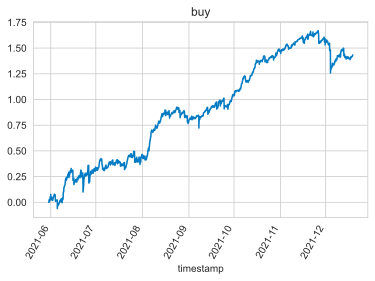

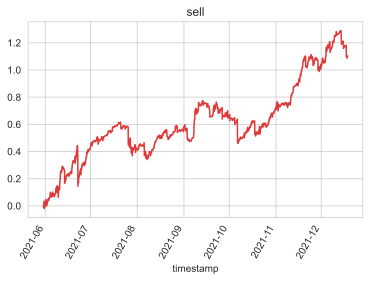

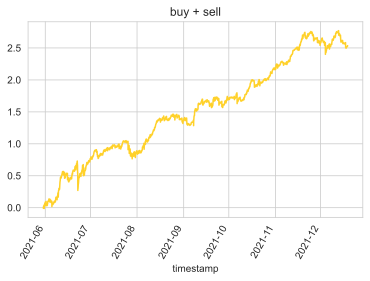

p平均法 n = 5
p平均 0.09921050665661175
エラー率 0.0002502978466287363


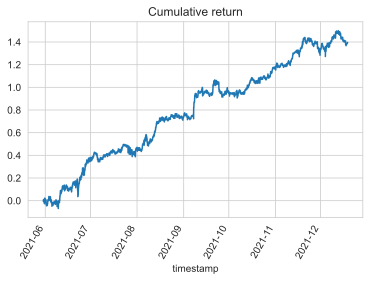

ポジション推移です。変動が細かすぎて青色一色になっていると思います。
ちゃんと全ての期間でトレードが発生しているので、正常です。


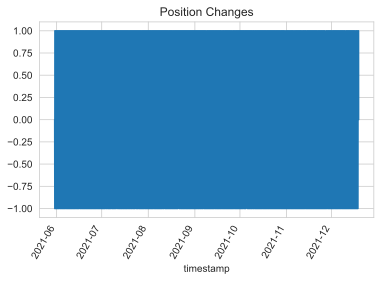

ポジションの平均の推移です。どちらかに偏りすぎていないかなどを確認できます。


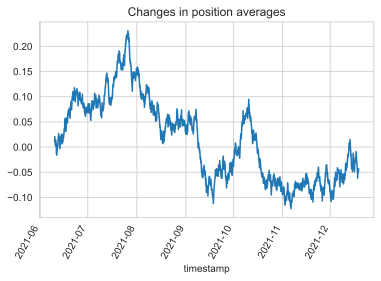

取引量(ポジション差分の絶対値)の累積です。
期間によらず傾きがだいたい同じなので、全ての期間でちゃんとトレードが行われていることがわかります。


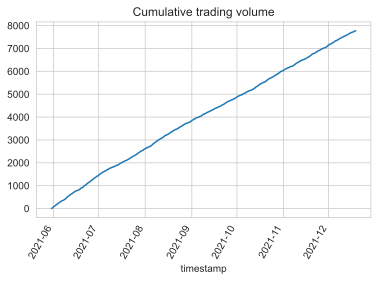

t検定
t値 3.219537690509456
p値 0.0012860882914997383
p平均法 n = 5
p平均 0.15919621758502586
エラー率 0.0026627629178804855
result:  1.3958413554968916


In [320]:
df = pd.read_pickle('df_fit_test_blend_opt.pkl')

show_cum_ret(df=df)
# バックテストで累積リターンと、ポジションを計算
df['cum_ret'], df['poss'] = backtest(
    cl=df['close'].values,
    buy_entry=df['y_pred_buy'].values > 0,
    sell_entry=df['y_pred_sell'].values > 0,
    buy_cost=df['buy_cost'].values,
    sell_cost=df['sell_cost'].values,
)
show_test_result(df=df)